# Aprendizaje Automático - Experimentación con agrupamiento y detección de anomalías  no supervisada

#### Valoración máxima: 10 puntos

#### Fecha límite de entrega: 19 de Mayo de 2024 a las 23:59

#### Entrega a través de https://pradogrado2324.ugr.es/

### Nombre completo: <mark>José Antonio Zamora Reyes</mark>



---


**Normas de desarrollo y entrega de trabajos**

- Única y exclusivamente se debe entregar este Notebook de Colab (fichero `.ipynb`) o, en su defecto, tres Notebooks de Colab (uno con cada ejercicio). No es necesario entregar ninguna memoria externa (por ejemplo, en `.pdf`).

- El código debe estar bien comentado (explicando lo que realizan los distintos apartados y/o bloques), y todas las decisiones tomadas y el trabajo desarrollado (incluyendo los conceptos fundamentales subyacentes) deben documentarse ampliamente en celdas de texto. Es obligatorio documentar las valoraciones y decisiones adoptadas en el desarrollo de cada uno de los apartados. Debe incluirse también tanto una descripción de las principales funciones (Python/scikit-learn) empleadas (para mostrar que el alumno comprende, a nivel técnico, lo que está haciendo), como una valoración razonada sobre la calidad de los resultados obtenidos. Sin esta documentación, se considera que el trabajo NO ha sido presentado.

- La entrega en PRADO está configurada para permitir sucesivas entregas de la práctica. Desde este punto de vista, se recomienda subir versiones de la práctica a medida que se van realizando los distintos ejercicios propuestos, y no dejarlo todo para el final.  

- Se debe respetar la estructura y secciones del Notebook. Esto servirá para agilizar las correcciones, así como para identificar con facilidad qué ejercicio/apartado se está respondiendo.

- El código NO puede escribir nada a disco.

- El path de lectura desde Google Drive debe ser siempre el mismo, que es el que se indica en este Notebook.

- Una entrega es apta para ser corregida si se puede ejecutar de principio a fin sin errores. Es decir, un ejercicio con errores de ejecución tendrá una calificación de 0.

- No es válido usar opciones en las entradas (es decir, utilizar el comando `input()`, por ejemplo, para que el usuario escoja el valor de las variables para ejecutar el programa). Para ello, se deben fijar al comienzo los valores por defecto que se consideren óptimos o que se soliciten en el enunciado.

- Se entrega solamente este Notebook, y no los datos empleados.


---

## <font color='blue'>Ejercicio 1: OPTIMIZANDO k-MEANS y DBSCAN (4 puntos)</font>

<font color='white'>La optimización de algoritmos de clustering como k-Means y DBSCAN en aprendizaje automático es fundamental para abordar aplicaciones reales debido a varias razones críticas. Primero, estas técnicas son ampliamente aplicadas en la segmentación de clientes, detección de anomalías, sistemas de recomendación, y otras áreas donde la agrupación efectiva de datos es crucial para extraer _insights_ significativos y tomar decisiones informadas. Optimizar estos algoritmos permite manejar grandes volúmenes de datos de manera eficiente, mejorando la velocidad y reduciendo los costos computacionales, lo cual es esencial en entornos donde el tiempo y los recursos son limitados. Además, al afinar estos métodos para incrementar su precisión y sensibilidad, se pueden identificar patrones y tendencias con mayor exactitud, lo que resulta en modelos más robustos y confiables. En un mundo donde los datos crecen exponencialmente, la capacidad de procesar y analizar esta información de manera efectiva es clave para el éxito en diversas aplicaciones prácticas, haciendo de la optimización y uso (incluso como parte de estrategias complejas de entrenamiento) de algoritmos de _clustering_ un componente indispensable en el campo del _machine learning_.

<font color='white'>En este ejercicio intentaremos profundizar un poco en cómo optimizar y operar con dos algoritmos de clustering básicos (k-Means y DBSCAN).



---




<font color='white'>Primero, importamos las librerías necesarias y fijamos la semilla aleatoria para que nuestros resultados sean reproducibles entre ejecuciones.


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import sklearn

# Fijamos la semilla aleatoria
np.random.seed(42) #¿Por qué 42? https://en.wikipedia.org/wiki/Phrases_from_The_Hitchhiker%27s_Guide_to_the_Galaxy

# Cambiamos aspecto de los gráficos
plt.rc('font', size=14)
plt.rc('axes', labelsize=14, titlesize=14)
plt.rc('legend', fontsize=14)
plt.rc('xtick', labelsize=10)
plt.rc('ytick', labelsize=10)





---






### <font color='blue'>Ejercicio 1.A: Optimizando k-Means (3 puntos)</font>

<font color='white'> Vamos a entrenar un agrupador K-Means en un conjunto de datos sintético en 2D, y vamos a intentar encontrar el centro de cada mancha y asignar cada instancia a la mancha/agrupación más cercana. Las tareas concretas a realizar en este ejercicio se resumen a continuación:
1.   Completamos el código con el ajuste de un `KMeans` usando 5 clusters y el hiperparámetro `n_init` con un valor igual a 1. Este hiperparámetro nos dice el número de veces que se ejecuta el algoritmo k-means con diferentes semillas de centroide (inicializaciones aleatorias). El resultado final es el mejor resultado de `n_init` ejecuciones consecutivas en términos de inercia. En general, suele ser recomendable emplear varias ejecuciones (especialmente, en problemas con alta dimensionalidad).
2.   Cada instancia se asignará a uno de los cinco clusters. En el contexto del clustering, la etiqueta de una instancia es el índice del cluster al que el algoritmo asigna esta instancia; esto no debe confundirse con las etiquetas de clase en clasificación, que se utilizan como objetivos. La instancia `KMeans` conserva las etiquetas predichas de las instancias con las que se entrenó, disponibles a través de la variable de instancia `labels_`. Imprimimos los centros de los 5 clusters y dibujamos los bordes de decisión de los 5 clusters obtenidos.
3. Predecimos cuatro nuevas instancias con valores `[[0, 2], [3, 2], [-3, 3], [-3, 2.5]]` utilizando el enfoque de clustering duro (`predict`) y clustering flexible (`transform`). En el primer caso, se proporciona uno de los clusters como aquel al que pertenece la instancia bajo estudio (es decir, cada instancia se asume que pertenece a un único cluster). En el segundo, se recupera un valor de pertenencia difuso/parcial de la instancia a cada uno de los clusters (es decir, cada instancia tiene un cierto grado de pertenencia a cada uno de los clusters).
4. A continuación, vamos a ver de qué forma influye la inicialización de los centroides en el resultado final. Vamos a escoger, de forma aproximada, dónde se pueden poner los 5 centroides para comenzar a iterar con un k-means. Para ello se puede lanzar `KMeans` con el hiperparámetro `n_init=1` y el hiperparámetro `init` con un `np.array` de 5 puntos en 2D escogidos manualmente por el estudiante. Prueba qué ocurre en este caso, imprimiendo los centros y dibujando los bordes de decisión de los 5 clusters obtenidos.
5. En la mayoría de casos reales y de interés, no es viable saber dónde están los centroides, pues los datos son más complejos. Para estos casos, el hiperpárametro `n_init` tiene un valor por defecto de 10; lo que significa que todo el algoritmo se ejecuta 10 veces cuando se llama a `fit()`, y Scikit-Learn se queda con la mejor solución. Pero, ¿cómo sabe exactamente qué solución es la mejor? Utiliza una métrica de rendimiento. Esa métrica se llama inercia del modelo, que es la suma de las distancias al cuadrado entre las instancias y sus centroides más cercanos. La clase `KMeans` ejecuta el algoritmo `n_init` veces y se queda con el modelo con la inercia más baja. La inercia de un modelo es accesible a través de la variable de instancia `inertia_`. El método `score()` devuelve la inercia negativa. ¿Por qué crees que devuelve el valor negativo? Imprime los valores `inertia_` y `score()` obtenidos en el apartado anterior.
6. Prueba diferentes métodos de inicialización (hiperparámetro `init`) y diferentes variantes de k-Medias con el hiperparámetro `algorithm`. Describe cada método de inicialización y compara gráficamente el resultado. ¿Notas diferencias significativas en las figuras representadas? ¿Por qué?
7. Vamos a encontrar el número óptimo de clusters utilizando el silhouette score, que lo podéis encontrar en `sklearn.metrics` importando `silhouette_score`.  Vamos a visualizar  este score para diferente número de clusters, desde 2 hasta 15  (ambos inclusive): eje X (número de clusters) vs eje Y (silhouette score).  Aquí utilizaremos el valor `n_init=10`. Analiza los resultados obtenidos.
8. Se puede obtener una visualización aún más informativa si representamos el coeficiente
de silueta de cada instancia, ordenado por los clusters a los que está asignada y
por el valor del coeficiente. Esto se denomina diagrama de siluetas
(véase https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html).
Cada diagrama contiene una forma de cuchillo por cluster. La altura de la forma indica el número
de instancias en el cluster, y su anchura representa los coeficientes de silueta
ordenados de las instancias en el cluster (más ancho es mejor). Dibuja los
coeficientes de silueta para un $k=\{3,4,5,6\}$ y analiza los resultados obtenidos.
9. El conjunto de datos clásico de Olivetti contiene 400 imágenes de rostros en escala
de grises de 64×64 píxeles. Cada imagen se aplana a un vector 1D de tamaño 4.096.
Se fotografiaron 40 personas diferentes (10 veces cada una), y la tarea habitual es
entrenar un modelo que pueda predecir qué persona está representada en cada imagen.
Carga el conjunto de datos utilizando la función `sklearn.datasets.fetch_olivetti_faces()`
y, a continuación, divídelo en un conjunto de entrenamiento y
unode test (ten en cuenta que el conjunto de datos ya está escalado entre 0 y 1).
Dado que el conjunto de datos es bastante pequeño, probablemente necesitaremos utilizar un muestreo
estratificado (`StratifiedShuffleSplit`) para asegurarnos de que hay el mismo número de imágenes por persona/clase/cluster en cada conjunto.
A continuación, agrupa las imágenes utilizando tres modelos de k-means (k-means++ con `n_init=10`,
random con `n_init=1`, y random con `n_init=10` y el algoritmo ` elkan` para agilizar cómputo), y
asegúrate de que empleamos un buen número de clústers (utilizando técnicas de los apartados anteriores).
Visualiza los clusters utilizando el mejor modelo (bajo tu criterio, que debes justificar) de los tres previos: ¿ves caras
similares en cada cluster? Es decir, ¿hemos sido capaces de agrupar rostros de las mismas personas de forma no supervisada? ¿Cómo de buenas son las predicciones realizadas con el conjunto de test: se corresponden adecuadamente con las identidades de entrenamiento?
¿Qué conclusiones extraes en base al trabajo realizado y los resultados obtenidos?
NOTA: Puedes utilizar reducción de dimensionalidad para agilizar el cómputo.

<font color='white'> El alumnado debe describir en detalle el trabajo realizado y las conclusiones extraídas.

In [ ]:
from sklearn.cluster import KMeans
from sklearn.datasets import make_blobs

blobs_c = np.array([[ 0,  2.5], [-1.5 ,  2.3], [-2.8,  1.7],
                         [-2.6,  3.5], [-2.9,  1.4]])
blob_std = np.array([0.45, 0.25, 0.1, 0.1, 0.05])
X, y = make_blobs(n_samples=2000, centers=blobs_c, cluster_std=blob_std,
                  random_state=42)

 Dibujamos las manchas.

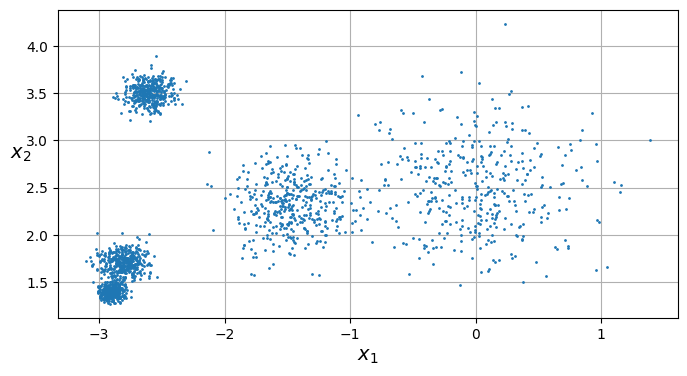

In [ ]:
def plot_clusters(X, y=None):
    plt.scatter(X[:, 0], X[:, 1], c=y, s=1)
    plt.xlabel("$x_1$")
    plt.ylabel("$x_2$", rotation=0)

plt.figure(figsize=(8, 4))
plot_clusters(X)
plt.gca().set_axisbelow(True)
plt.grid()
plt.show()

Apartado 1 :

Aplico el modelo kmeans con 5 clusters y con n_init = 1 , una vez entrenado el modelo obtenemos los centros de los clusters para marcarlos en el grafico y tambien obtenemos las etiquetas.
Finalmente mostramos el grafico , para poder observar los clusters que se han formado.

Apartado 2:

En este apartado el objetivo es msotrar los bordes de decision , estos delimitaran la grafica e indicaran las regiones en las que una instancia pertenecerá a un cluster u otro.

Para mostrar la grafica que muestra tanto los cluster como los bordes de decision , nos apoyamos en la funcion "plot_decision_boundaries" , la cual ya esta implementada

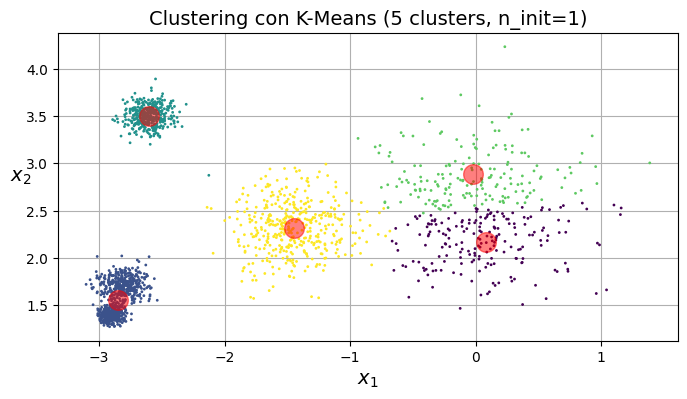

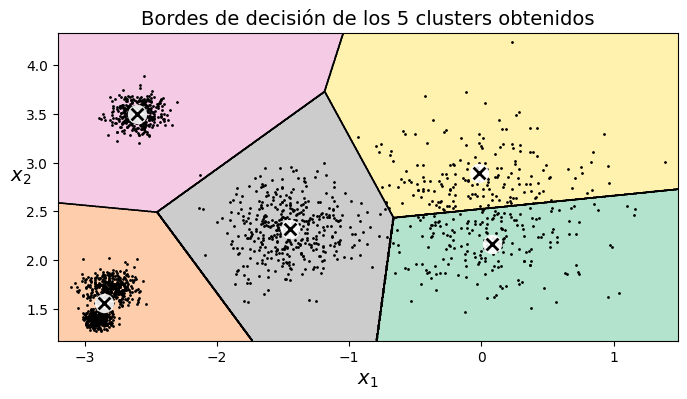

In [ ]:
# Apartado 1
k = 5
kmeans = KMeans(n_clusters=5 , n_init=1)
#A CUBRIR POR EL ALUMNADO
#Entrenamos
kmeans.fit(X)

#Obtenemos centros de los clusters
centroids = kmeans.cluster_centers_

#Obtner etiquetas
labels = kmeans.labels_

# Visualizar los clústeres y sus centros
plt.figure(figsize=(8, 4))
plot_clusters(X, labels)
plt.scatter(centroids[:, 0], centroids[:, 1], marker='o', c='red', s=200, alpha=0.5)
plt.gca().set_axisbelow(True)
plt.grid()
plt.title('Clustering con K-Means (5 clusters, n_init=1)')
plt.show()


#Apartado 2
def plot_data(X):
    plt.plot(X[:, 0], X[:, 1], 'k.', markersize=2)

def plot_centroids(centroids, weights=None, circle_color='w', cross_color='k'):
    if weights is not None:
        centroids = centroids[weights > weights.max() / 10]
    plt.scatter(centroids[:, 0], centroids[:, 1],
                marker='o', s=35, linewidths=8,
                color=circle_color, zorder=10, alpha=0.9)
    plt.scatter(centroids[:, 0], centroids[:, 1],
                marker='x', s=2, linewidths=12,
                color=cross_color, zorder=11, alpha=1)

def plot_decision_boundaries(clusterer, X, resolution=1000, show_centroids=True,
                             show_xlabels=True, show_ylabels=True):
    mins = X.min(axis=0) - 0.1
    maxs = X.max(axis=0) + 0.1
    xx, yy = np.meshgrid(np.linspace(mins[0], maxs[0], resolution),
                         np.linspace(mins[1], maxs[1], resolution))
    Z = clusterer.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)

    plt.contourf(Z, extent=(mins[0], maxs[0], mins[1], maxs[1]),
                cmap="Pastel2")
    plt.contour(Z, extent=(mins[0], maxs[0], mins[1], maxs[1]),
                linewidths=1, colors='k')
    plot_data(X)
    if show_centroids:
        plot_centroids(clusterer.cluster_centers_)

    if show_xlabels:
        plt.xlabel("$x_1$")
    else:
        plt.tick_params(labelbottom=False)
    if show_ylabels:
        plt.ylabel("$x_2$", rotation=0)
    else:
        plt.tick_params(labelleft=False)

#A CUBRIR POR EL ALUMNADO
# Dibujar los bordes de decisión de los 5 clusters obtenidos
plt.figure(figsize=(8, 4))
plot_decision_boundaries(kmeans, X)
plt.title('Bordes de decisión de los 5 clusters obtenidos')
plt.show()

Apartado 3:

En este apartado predecimos 4 nuevas intancias , mediante el uso de .predict(X_new) , logramos conocer el cluster al que la instancia pertenece (clustering duro) ,mediante el uso de .transform(X_new) , logramos conocer el grado de pertenencia de cada una de las instancias para los diferentes clusters .

Al final mostramos los resultados.

In [ ]:
#Apartado 3
X_new = np.array([[0, 2], [3, 2], [-3, 3], [-3, 2.5]])
#A CUBRIR POR EL ALUMNADO

# Enfoque de clustering duro (predict)
predicted_clusters_hard = kmeans.predict(X_new)

# Enfoque de clustering flexible (transform)
soft_assignments = kmeans.transform(X_new)

print("Predicted clusters (hard clustering):", predicted_clusters_hard)
print("Closest cluster indices (flexible clustering):", soft_assignments)

Predicted clusters (hard clustering): [0 0 2 1]
Closest cluster indices (flexible clustering): [[0.18223039 2.88604435 3.00245465 0.89138253 1.48240029]
 [2.92625035 5.86829444 5.79854651 3.14941474 4.45922309]
 [3.18974087 1.45428401 0.63877213 2.98127968 1.69530934]
 [3.09660472 0.95827092 1.07572208 3.00485781 1.56275789]]


Apartado 4:

En este apartado antes de aplicar el modelo , vamos a definir los centroides , para ello elijo unos centroides que se aproximen a donde se estarian los centroides de los clusters , que podemos ver a simple vista.

Una vez establecidos los centroides procedemos a aplicar el modelo con estos centroides y lo entrenamos.

Por último visualizo nuevamente los clusters , apoyandome en la funcion "plot_decision_boundaries".

En la visualizacion podemos observar como las instancias son las mismas , sin embargo esta vez se han obtenido unos clusters diferentes , esto es debido a los centroides que hemos establecido.

Podemos observar como el conjunto de instancias de la derecha del todo se toman como un cluster único , esto tiene más sentido y el conjunto de puntos de la parte inferior izquierda , se divide en dos clusters , esto también tiene sentido debido a que podemos ver como ese conjunto de puntos esta dividedo a su vez en dos manchas de instancias , las cuales indican que son dos clusters diferentes.

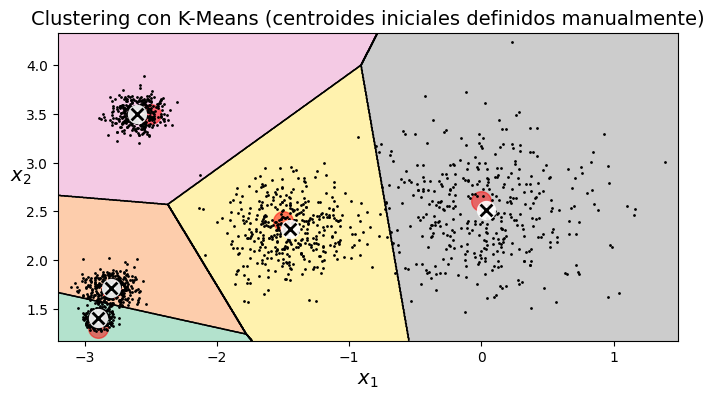

Centros de los clústeres obtenidos con centroides iniciales definidos manualmente:
[[-2.89613756  1.40395196]
 [-2.80242208  1.71599211]
 [-2.60140129  3.49914817]
 [-1.44662744  2.31979215]
 [ 0.03369891  2.50939959]]


In [ ]:
#Apartado 4
good_init =  np.array([[-2.9, 1.3], [-2.8, 1.7], [-2.5, 3.5], [-1.5, 2.4], [0, 2.6]])
#A CUBRIR POR EL ALUMNADO


# Instanciar y entrenar el modelo K-Means con centroides iniciales definidos manualmente y n_init=1
kmeans_custom_init = KMeans(n_clusters=5, init=good_init, n_init=1)
kmeans_custom_init.fit(X)

# Obtener los centros de los clústeres
centroids_custom_init = kmeans_custom_init.cluster_centers_

# Visualizar los clústeres y sus centros
plt.figure(figsize=(8, 4))
plot_decision_boundaries(kmeans_custom_init, X)
plt.scatter(good_init[:, 0], good_init[:, 1], marker='o', c='red', s=200, alpha=0.5)
plt.title('Clustering con K-Means (centroides iniciales definidos manualmente)')
plt.show()

print("Centros de los clústeres obtenidos con centroides iniciales definidos manualmente:")
print(centroids_custom_init)

Apartado 5:

En este apartado vamos a calcular la inercia y el score , la inercia basicamnte indica como de compactos son los clusters, es decir , cuanto menor sea la inercia más compactos serań los clusters , que la inercia sea menor se considera por lo generar bueno.
Score devuelve el negativa de la inercia , esto se hace por convencion para que un valor de score más alto indique un mejor resultado , partiendo con la idea de que score más alto es el mejor en la mayoría de los casos.

En este apratdo calculamos el score y la inercia y lo imprimimos para garantizar que se cumple que el score es la inercia en negativo.

In [ ]:
#Apartado 5
#A CUBRIR POR EL ALUMNADO
# Imprimir los valores de inertia_ y score() obtenidos en el apartado anterior
print("Inercia del modelo:", kmeans_custom_init.inertia_)
print("Score del modelo (inercia negativa):", kmeans_custom_init.score(X))

Inercia del modelo: 212.05813530578345
Score del modelo (inercia negativa): -212.05813530578348


Apartado 6:

En este apartado pruebo diferentes variantes del algoritmo KMeans y observo como se comporta.

Utilizo como variantes K-means++,el cual selecciona de manera inteligente los centroides para acelerar la convergencia del algoritmo y mejorar la calidad del clustering , tambien utilizo random , el cual selecciona los centroides de manera aleatoria , lo que puede producir peores resultados y una convergencia más lenta , es importante señalar que random es útil cuando la inicializacion predeterminada de los centroides, no es buena.

Para el hiperparámetro algorithm , utilizo Lloyd , el cual es el método tradicional de actualización de centroides , tambien uso Elkan , el cual utiliza la poda de distancia , reduce el numero de calculos de distancia necesarios .Esto nos ayuda a acelerar la convergencia.

Tras diferentes ejecuciones , puedo observar que por regla general es la variante ramdon tanto con Lloyd como con Elkan , la que produce una mejor eleccion de centroides , esto cumple con lo comentado anteriormente , de que cuando la inicilizacion de centroides predeterminada es mala , puede ser de utilidad el uso de la variante random.

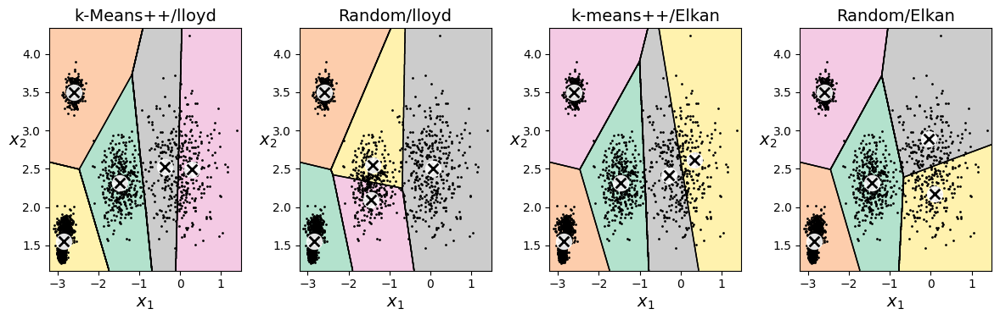

In [ ]:
#Apartado 6
#A CUBRIR POR EL ALUMNADO

from sklearn.cluster import KMeans


kmeans_ll = KMeans(n_clusters=5, init='k-means++', algorithm='lloyd', n_init=1)
random_ll = KMeans(n_clusters=5, init='random', algorithm='lloyd', n_init=1)
kmeans_elkan = KMeans(n_clusters=5, init='k-means++', algorithm='elkan', n_init=1)
random_elkan = KMeans(n_clusters=5, init='random', algorithm='elkan', n_init=1)

# Ajustar los modelos a los datos
kmeans_ll.fit(X)
random_ll.fit(X)
kmeans_elkan.fit(X)
random_elkan.fit(X)

# Visualizar los resultados
plt.figure(figsize=(12, 4))

plt.subplot(141)
plot_decision_boundaries(kmeans_ll, X)
plt.title('k-Means++/lloyd')

plt.subplot(142)
plot_decision_boundaries(random_ll, X)
plt.title('Random/lloyd')

plt.subplot(143)
plot_decision_boundaries(kmeans_elkan, X)
plt.title('k-means++/Elkan')

plt.subplot(144)
plot_decision_boundaries(random_elkan, X)
plt.title('Random/Elkan')

plt.tight_layout()
plt.show()



Apartado 7:

En este apartado vamos a buscar cual es el numero de cluster optimo , para ello vamos a utilizar silhouette_score el cual indica como de similares son los puntos de un mismo clusters y como de diferentes son de puntos de otros clusters.

Valores del silhouette_score más altos , indican que los puntos estan bien agrupados dentro de sus propios clusters y que estan bien separados de los puntos de otros clusters.

En este ejercicio veremos cual es este valor cuando se aplica Kmeans con diferente numero de clusters.

Si observamos el gráfico generado podemos observar que con el numero de clusters con el cual mejor silhoutte_score se consigue es 4 , indicando de esta manera que es posible que este sea el numero de clusters opitmo , tambien podemos observar como con un numero de clusters igual a 3 , 5 o 6 tampoco se obtiene malos resultados .

En la gráfica podemos observar como a partir de un numero de cluster igual a 8 , el silhouette_score se mantiene más constante , esto quiere decir que el dividir los datos en más de 8 clusters  no proporciona uan estructuar de clusters significativa y que los clusters adicionales no son claramente distinguibles.

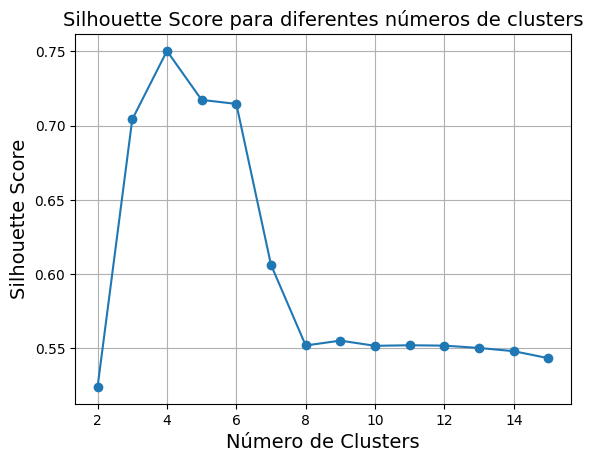

In [ ]:
#Apartado 7
from sklearn.metrics import silhouette_score

#A CUBRIR POR EL ALUMNADO

# Lista para almacenar los silhouette scores
silhouette_scores = []

# Número de clusters a probar
num_clusters_range = range(2, 16)

# Calcular silhouette score para cada número de clusters
for num_clusters in num_clusters_range:
    kmeans = KMeans(n_clusters=num_clusters, n_init=10)
    kmeans.fit(X)
    labels = kmeans.labels_
    silhouette_scores.append(silhouette_score(X, labels))

# Visualizar los resultados
plt.plot(num_clusters_range, silhouette_scores, marker='o')
plt.xlabel('Número de Clusters')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score para diferentes números de clusters')
plt.grid(True)
plt.show()

Apartado 8:

Esta tecnica de los cuchillos nos ayuda a observar mucho mejor los coeficientes de silueta
La altura nos indica el número de instancias en el cluster, y la anchura representa los coeficientes de silueta de las instancias de cluster(Se encuentran ordenados, es por ello que se origina la forma de cuchillo)

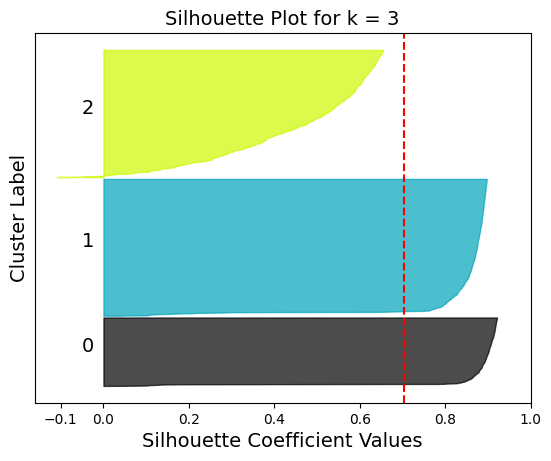

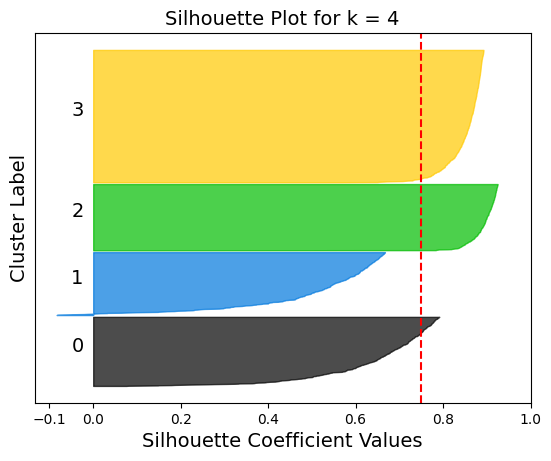

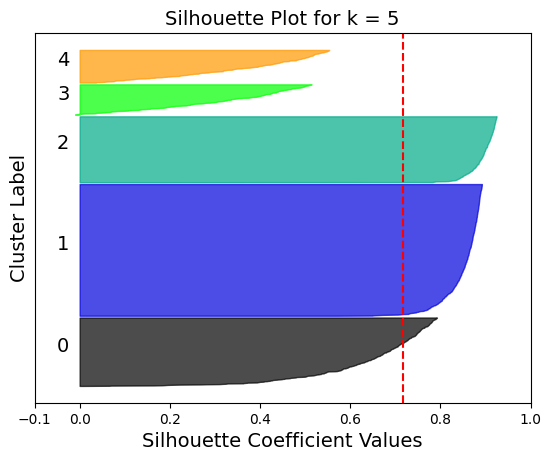

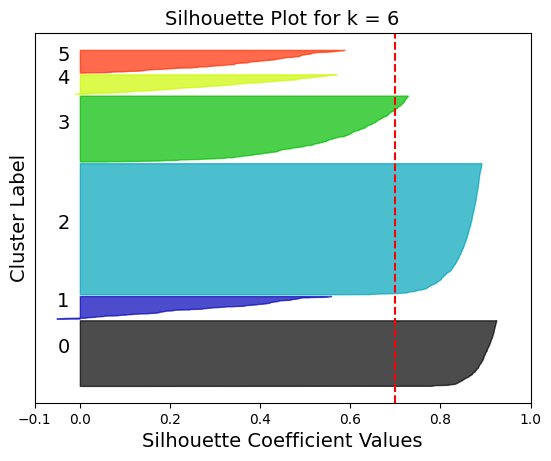

In [ ]:
#Apartado 8

from sklearn.metrics import silhouette_samples
from matplotlib.ticker import FixedLocator, FixedFormatter
import matplotlib.cm as cm

#A CUBRIR POR EL ALUMNADO
# Valores de k a probar
k_values = [3, 4, 5, 6]

# Para cada valor de k
for k in k_values:
    # Instanciar y ajustar el modelo KMeans
    kmeans = KMeans(n_clusters=k, n_init=10)
    kmeans.fit(X)
    cluster_labels = kmeans.labels_

    # Calcular el coeficiente de silueta para cada instancia
    silhouette_vals = silhouette_samples(X, cluster_labels)

    # Inicializar una lista para almacenar los coeficientes de silueta ordenados por cluster
    sorted_silhouette_vals = []

    # Ordenar los coeficientes de silueta para cada cluster
    for i in range(k):
        sorted_silhouette_vals.append(silhouette_vals[cluster_labels == i])
        sorted_silhouette_vals[i].sort()

    # Calcular la altura de cada forma de cuchillo
    y_lower = 10
    for i in range(k):
        size_cluster_i = sorted_silhouette_vals[i].shape[0]
        y_upper = y_lower + size_cluster_i
        color = cm.nipy_spectral(float(i) / k)
        plt.fill_betweenx(np.arange(y_lower, y_upper), 0, sorted_silhouette_vals[i], facecolor=color, edgecolor=color, alpha=0.7)
        plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))
        y_lower = y_upper + 10

    # Configuración de la gráfica
    plt.title('Silhouette Plot for k = {}'.format(k))
    plt.xlabel('Silhouette Coefficient Values')
    plt.ylabel('Cluster Label')
    plt.axvline(x=np.mean(silhouette_vals), color='red', linestyle='--')
    plt.yticks([])
    plt.xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])
    plt.show()

Las gráficas presentan los coeficientes de silueta para diferentes numeros de clusters (3, 4, 5 y 6) en un conjunto de datos. El coeficiente de silueta evalúa lo bien que se agrupan los puntos dentro de un cluster comparado con otros clusters. Los valores del coeficiente de silueta oscilan entre -1 y 1, donde valores cercanos a 1 indican una buena agrupación y valores cercanos a -1 sugieren que los puntos estarían mejor en otro cluster.



*   K = 3

    Vemos clusters con un numero de instancias similares , es el clsuters 2 el que tiene algo menos.

    En cuanto a las siluetas vemos que son por lo general valores altos.

    Obtenemos una media alta , siendo esta aproximada a 0.7.

    Cabe destacar que existen instancias en el clusters 2 , que estarían mejor en otros clusters , debido a que proporciona una silueta negativa.

*   K = 4

    Vemos clusters con un numero de instancias similares.

    En cuanto a las siluetas vemos que son por lo general valores altos.

    Obtenemos una media alta , siendo esta aproximada a 0.8.

    En el clusters 1 existen instancias que producen siluetas negativas esto indica que estrían mejor en otros clusters.

*   K = 5

    Existe una mayor variabilidad en el numero de instancias de cada clusters.

    En cuanto a las siluetas podemos observar tanto valores bastante bajos como valores altos , sin embargo la media que obtenemos no es mala siendo algo superior a 0.7.

    Con k = 5 , tambien observamos que en el clusters 3 tiene instancias con valores de silueta negativo , pero estas instancias no son muchas.

*   K = 6

    Existe una mayor variabilidad en el numero de instancias de cada clusters.

    En cuanto a las siluetas , pasa igual que con K= 5 , hay valores bajos y otros altos.

    La media que obtenemos es similar a 0.7 .

    En el clusters 1 existen instancias que producen siluetas negativas esto indica que estrían mejor en otros clusters.

Como conclusion creo que la mejor eleccion seria elegir el numero de clusters igual a 4 , debido a que el numero de instancias en cada clusters es similar y la media de la silueta es bastante alta (0.8) ,
el numero de clusters igual a 3 , tampoco es mala eleccion pero no es tan buena como numero de clusters igual a 4.





In [ ]:
#Apartado 9

from sklearn.datasets import fetch_olivetti_faces
import matplotlib.pyplot as plt
olivetti = fetch_olivetti_faces()

from sklearn.model_selection import StratifiedShuffleSplit

#A CUBRIR POR EL ALUMNADO

def plot_faces(faces, labels, n_cols=5):
    faces = faces.reshape(-1, 64, 64)
    n_rows = (len(faces) - 1) // n_cols + 1
    plt.figure(figsize=(n_cols, n_rows * 1.1))
    for index, (face, label) in enumerate(zip(faces, labels)):
        plt.subplot(n_rows, n_cols, index + 1)
        plt.imshow(face, cmap="gray")
        plt.axis("off")
        plt.title(label)
    plt.show()

#A CUBRIR POR EL ALUMNADO

### <font color='blue'>Ejercicio 1.B: Utilización de DBSCAN (1 punto)</font>

<font color='white'> En este ejercicio haremos algo similar a lo realizado en el anterior, pero ahora con otro problema sintético en 2D y el algoritmo DBSCAN. Para crear el conjunto sintético haremos uso de la función `make_moons` dentro del paquete de `sklearn.datasets`. Crearemos un conjunto sintético de $1.000$ puntos con una tasa de ruido de $0.05$.


<font color='white'> Las tareas a realizar a realizar en este ejercicio se resumen a continuación:
1. A partir del conjunto de datos especificado, ajusta un algoritmo DBSCAN con los hiperparámetros por defecto (5 mínimas muestras por cluster). Identifica los índices de los ejemplos núcleo (_core points_)) e imprime sus coordenadas. Para ello, emplea las variables de instancia `core_sample_indices_` y `components_`, respectivamente.
2. La variable de instancia `labels_` contiene el núcleo al que pertenece cada ejemplo
del conjunto de datos. Observa que algunas instancias tienen un índice de cluster
igual a -1, lo que significa que el algoritmo las considera anomalías. En un conjunto
sencillo como este, en un principio, no debería haber anomalías. El hiperparámetro `eps` indica la distancia
máxima entre dos muestras para que una se considere vecina de la otra (no se trata de un
límite máximo de las distancias de los puntos dentro de un cluster). Es el hiperparámetro
de DBSCAN más importante que debes elegir adecuadamente para tu conjunto de datos y
función de distancia. Ajusta 4 modelos de DBSCAN con el hiperparámetro $eps$ igual a
$\{0.01,0.02,0.05,0.1\}$. Dibuja una representación de los clústers para cada modelo
identificando las anomalías que tiene en el gráfico y dando el porcentaje de anomalías
de cada modelo. Analiza y explica los resultados obtenidos.
3. Sorprendentemente, la clase DBSCAN no tiene un método `predict()`,
aunque sí tiene un método `fit_predict()`. En otras palabras, no puede predecir
a qué cluster pertenece una nueva instancia. Esta decisión se tomó porque diferentes
algoritmos de clasificación pueden ser mejores para diferentes tareas, por lo que los
autores decidieron dejar que el usuario eligiera cuál utilizar. Pero sí se puede usar
un clasificador para ver en qué cluster está cada punto nuevo. Hazlo con un clasificador
kNN con un vecindario de 30 vecinos, usando el mejor modelo del apartado anterior y utilizando como
ejemplos de entrenamiento los _core points_ encontrados y como etiquetas (salidas deseadas) las `labels_` obtenidas. Obtén el cluster asociado y la probabilidad para los
siguientes 4 ejemplos `[[-0.5, 0], [0, 0.5], [1, -0.1], [2, 1]]`.
Junto con lo anterior, dibuja un gráfico que represente los bordes de decisión y aplica también k-means sobre los mismo datos. Analiza las diferencias entre dichas fronteras de decisión en base al funcionamiento y naturaleza de los dos algoritmos subyacentes.
    
<font color='white'> El alumnado debe describir en detalle el trabajo realizado y las conclusiones extraídas.



---



Apartado 1:

Este apartado consiste basicamente en analizar los indices y las coordenadas de los core points , para ello entrenamos el modelos DBSCAN con 1000 puntos y con un ruido de 0.05 , una vez entrenamos procedemos a sacar los indices con (core_sample_indices_) y las cordenadas de ellos con (components_) .

Los resultados son mostrados.

No lo pide el apartado pero muestro una grafica donde se pueden observar los core_points

Indices de los core points:
[  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125
 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143
 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161
 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179
 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197
 198 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215
 216 217 218 219 220 221 222 223 224 225 226 227 228 229 230 231 232 233
 234 235 236 237 238 23

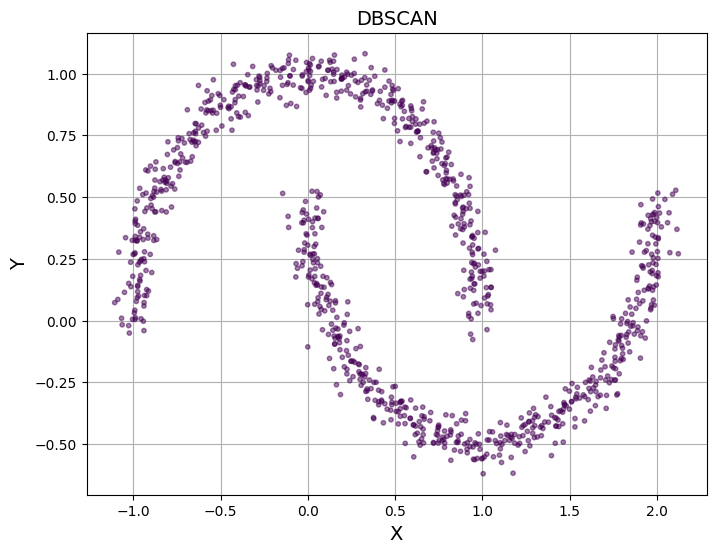

In [ ]:
#Apartado 1
from sklearn.cluster import DBSCAN
from sklearn.datasets import make_moons
import matplotlib.pyplot as plt

#Genera el conjunto de datos con 1000 muestras y 0.05 de ruido
X, y = make_moons(n_samples=1000, noise=0.05, random_state=42)

#A CUBRIR POR EL ALUMNADO

# Ajusta el algoritmo DBSCAN con hiperparámetros por defecto
dbscan = DBSCAN()
#Se entrenan los datos de X
dbscan.fit(X)

# Obtiene los índices de los ejemplos núcleo (core points)
indices_nucleo = dbscan.core_sample_indices_

# Obtiene las coordenadas de los ejemplos núcleo
coordenadas_nucleo = dbscan.components_

#Imprime las coordenadas de los indices de los core points
print("Indices de los core points:")
print(indices_nucleo)

# Imprime las coordenadas de los ejemplos núcleo
print("Coordenadas de los core points:")
print(coordenadas_nucleo)

# Función para visualizar los clusters
def plot_clusters(X):
    plt.scatter(X[:, 0], X[:, 1], c=dbscan.labels_, cmap='viridis', s=10, alpha=0.5)
    plt.xlabel("X")
    plt.ylabel("Y")
    plt.title("DBSCAN")

plt.figure(figsize=(8, 6))
plot_clusters(X)
plt.gca().set_axisbelow(True)
plt.grid()
plt.show()

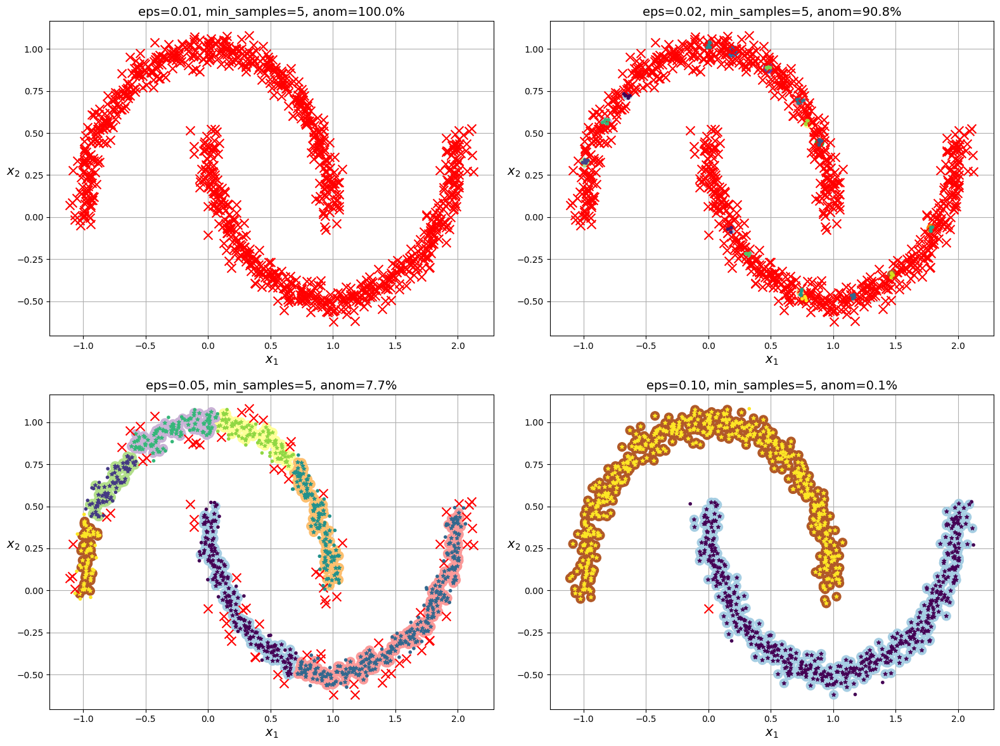

In [ ]:
#Apartado 2
def plot_dbscan(dbscan, X, size, show_xlabels=True, show_ylabels=True, anom_rate = 0):
    core_mask = np.zeros_like(dbscan.labels_, dtype=bool)
    core_mask[dbscan.core_sample_indices_] = True
    anomalies_mask = dbscan.labels_ == -1
    non_core_mask = ~(core_mask | anomalies_mask)

    cores = dbscan.components_
    anomalies = X[anomalies_mask]
    non_cores = X[non_core_mask]

    plt.scatter(cores[:, 0], cores[:, 1],
                c=dbscan.labels_[core_mask], marker='o', s=size, cmap="Paired")
    plt.scatter(cores[:, 0], cores[:, 1], marker='*', s=20,
                c=dbscan.labels_[core_mask])
    plt.scatter(anomalies[:, 0], anomalies[:, 1],
                c="r", marker="x", s=100)
    plt.scatter(non_cores[:, 0], non_cores[:, 1],
                c=dbscan.labels_[non_core_mask], marker=".")
    if show_xlabels:
        plt.xlabel("$x_1$")
    else:
        plt.tick_params(labelbottom=False)
    if show_ylabels:
        plt.ylabel("$x_2$", rotation=0)
    else:
        plt.tick_params(labelleft=False)
    plt.title(f"eps={dbscan.eps:.2f}, min_samples={dbscan.min_samples}, anom={anom_rate}%")
    plt.grid()
    plt.gca().set_axisbelow(True)

#A CUBRIR POR EL ALUMNADO


# Conjunto de datos
X, y = make_moons(n_samples=1000, noise=0.05, random_state=42)

# Valores de epsilon (eps)
eps_values = [0.01, 0.02, 0.05, 0.1]

# Ajuste de los modelos DBSCAN con diferentes valores de epsilon
plt.figure(figsize=(16, 12))
for i, eps in enumerate(eps_values, 1):
    dbscan = DBSCAN(eps=eps, min_samples=5)
    dbscan.fit(X)
    #Anomaliass
    anomalies_percentage = np.sum(dbscan.labels_ == -1) / len(X) * 100
    plt.subplot(2, 2, i)
    #visualizar clusters y anomalias
    plot_dbscan(dbscan, X, size=100, anom_rate=anomalies_percentage)
plt.tight_layout()
plt.show()


*eps = 0.01:*

La mayoría de los puntos son considerados anomalías.

El valor de epsilon es demasiado pequeño, por lo que muchos puntos no tienen suficientes vecinos cercanos para ser considerados como parte de un núcleo.

**Porcentaje de anomalías:** Muy alto.

*eps = 0.02:*

Todavía hay un número significativo de anomalías, pero menos que con eps=0.01.
Aunque se agrupan más puntos que con eps=0.01, el valor de epsilon sigue siendo pequeño para formar clusters grandes.

**Porcentaje de anomalías:** Alto.



*eps = 0.05:*

Los clusters empiezan a formarse claramente y el número de anomalías se reduce significativamente.
Este valor de epsilon permite que más puntos sean considerados como vecinos, formando clusters más definidos.

**Porcentaje de anomalías:** Moderado.

*eps = 0.1:*

Los clusters son grandes y bien definidos con muy pocas anomalías.
Un valor de epsilon mayor permite que más puntos se agrupen, resultando en clusters más grandes y menos anomalías

**Porcentaje de anomalías:** Bajo.



CONCLUSION:



La eleccion del epsilon es crucial , para poder obtener buenos resultados con DBSCAN.
Un valor muy pequeño origina muchas anomalias , mientras que con una valor más grande de epsilon , conseguimos agrupar mucho mejor los puntos produciendose de esta manera menos anomalías

Predicciones para los nuevos puntos:
Punto [-0.5  0. ] - Cluster: 1, Probabilidades: [0.1 0.9]
Punto [0.  0.5] - Cluster: 0, Probabilidades: [1. 0.]
Punto [ 1.  -0.1] - Cluster: 1, Probabilidades: [0. 1.]
Punto [2. 1.] - Cluster: 0, Probabilidades: [1. 0.]


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


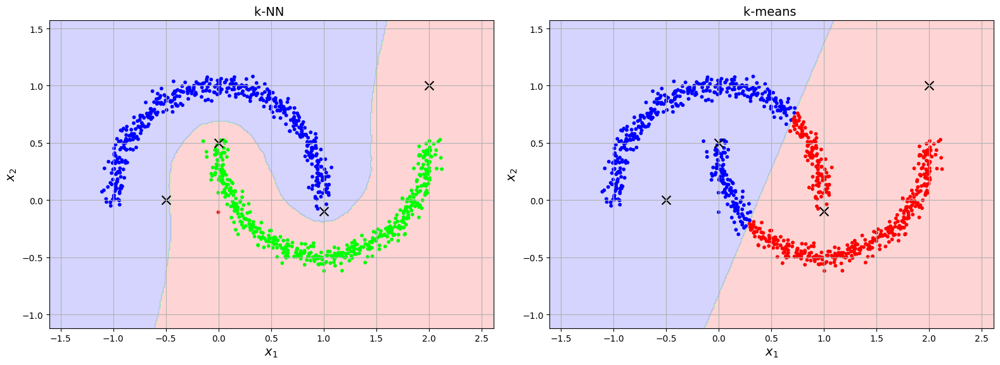

In [ ]:
#Apartado 3
from sklearn.neighbors import KNeighborsClassifier

#A CUBRIR POR EL ALUMNADO

from sklearn.cluster import KMeans
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap


# Conjunto de datos con 1000 muestras y 0.05 de ruido
X, y = make_moons(n_samples=1000, noise=0.05, random_state=42)

# Mejor modelo DBSCAN del apartado anterior (0.1) , para encontrar los puntos nucleo y sus etiquetas
best_eps = 0.1
dbscan = DBSCAN(eps=best_eps, min_samples=5)
dbscan.fit(X)

# Obtener puntos núcleo y etiquetas
core_samples_mask = np.zeros_like(dbscan.labels_, dtype=bool)
core_samples_mask[dbscan.core_sample_indices_] = True
core_samples = dbscan.components_
core_labels = dbscan.labels_[core_samples_mask]

# Entrenar el clasificador k-NN con 30 vecinos usando los puntos nucleo encontrados como ejemplos de entrenamiento
# y sus etiquetas como salidas deseadas
knn = KNeighborsClassifier(n_neighbors=30)
knn.fit(core_samples, core_labels)

# Nuevos puntos para predecir
new_points = np.array([[-0.5, 0], [0, 0.5], [1, -0.1], [2, 1]])
predicted_labels = knn.predict(new_points)
predicted_probabilities = knn.predict_proba(new_points)

# Imprime el punto ,el cluster y y la probabilidad
print("Predicciones para los nuevos puntos:")
for point, label, prob in zip(new_points, predicted_labels, predicted_probabilities):
    print(f"Punto {point} - Cluster: {label}, Probabilidades: {prob}")

# Aplicar k-means a los mismos datos para encontara los clusters
kmeans = KMeans(n_clusters=2, random_state=42)
kmeans.fit(X)
kmeans_labels = kmeans.labels_

# Visualizar los bordes de decisión
#Cinco argumentos modelo , datos de entrada , etiquetas de clase , eje , titulo
def plot_decision_boundaries(model, X, y, ax, title):
    h = 0.01
    x_min, x_max = X[:, 0].min() - 0.5, X[:, 0].max() + 0.5
    y_min, y_max = X[:, 1].min() - 0.5, X[:, 1].max() + 0.5
    #Se utiliza meshgrid para crear una malla de puntos , utilizando el paso de malla(h = 0.01)
    xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))
    #Prediccion de las etiquetas para la malla , estas etiquetas se alamcenan en una matriz y se reformatean
    #para que coincidan con la forma de la malla de puntos
    Z = model.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)
    #Mapas de colores
    cmap_light = ListedColormap(['#FFAAAA', '#AAFFAA', '#AAAAFF'])
    cmap_bold = ListedColormap(['#FF0000', '#00FF00', '#0000FF'])
    #visualizamos fondo del grafico
    ax.contourf(xx, yy, Z, cmap=cmap_light, alpha=0.5)
    #Visualizacion de los puntos de datos
    ax.scatter(X[:, 0], X[:, 1], c=y, cmap=cmap_bold, s=10)
    #Visulizacion de los nuevos puntos , estso son las X en la gráfica
    ax.scatter(new_points[:, 0], new_points[:, 1], c='k', marker='x', s=100)
    ax.set_title(title)
    ax.set_xlabel("$x_1$")
    ax.set_ylabel("$x_2$")
    ax.grid()

# Visualización
fig, axes = plt.subplots(1, 2, figsize=(16, 6))
plot_decision_boundaries(knn, X, dbscan.labels_, axes[0], "k-NN ")
plot_decision_boundaries(kmeans, X, kmeans_labels, axes[1], "k-means ")
plt.tight_layout()
plt.show()

K-NN se adpata mejor a datos con formas de clusters complejas y no lineales , como es en este caso .
K-means es mas adecuado para clusters esfericos y de tamaños similares , es este las fronteras de decision son más simpkes y pueden no capturar adecuadamente las estructuras de datos complejos .
Como conclusion la eleccion de un algoritmo u otro depende de los datos que queremos clasificar .
En este caso seria idóneo el uso del algoritmo K-NN, debido a la naturaleza de los datos , los cueles de agrupan en clusters que no son lineales

## <font color='blue'>Ejercicio 2: PROBLEMA DE AGRUPAMIENTO (5 puntos)</font>

<font color='white'> Para la realización de este ejercicio, se ha seleccionado el dataset denominado "Anuran Calls (MFCCs)" [1] (https://archive.ics.uci.edu/dataset/406/anuran+calls+mfccs). Este conjunto de datos describe las características sonoras de los cantos de diferentes especies de anfibios del orden Anura, cuyos integrantes coloquialmente son conocidos como ranas o sapos.

<font color='white'> Se encuentran representados por medio de los coeficientes cepstrales en las frecuencias de Mel ([_Mel-frequency cepstral coefficients_](https://en.wikipedia.org/wiki/Mel-frequency_cepstrum), MFCCs), que son en esencia, una representación abstracta de una señal de audio obtenida al aplicar una transformada del coseno discreta a un espectrograma de Mel, es decir, una representación  de las frecuencias auditivas que son capaces de captar los humanos. Debido a ser una representación compacta del [espectrograma](https://en.wikipedia.org/wiki/Spectrogram), manteniendo las características más importantes del audio, se utiliza de forma regular en procesado del habla y aplicaciones de aprendizaje automático en procesado de señales de audio [2].

<font color='white'> El dataset, creado por investigadores de la Universidad Federal del Amazonas en Brasil, contiene individuos de 10 especies, también incluyéndose su género y familia taxonómica, con el objetivo original de lograr realizar una clasificación multiclase de las especies de anuros que fueron grabados en los terrenos de la Universidad, así como de Mata atlántica (Brasil) y Córdoba (Argentina) en condiciones reales, es decir, con ruido de fondo.
    
<font color='white'> Este conjunto de datos se utilizó en varias tareas de clasificación relacionadas con el reto del reconocimiento de especies de anuros a través de sus llamadas. Se trata de un conjunto de datos multietiqueta con tres columnas de etiquetas. Este conjunto de datos se creó segmentando 60 registros de audio pertenecientes a 4 familias diferentes, 8 géneros y 10 especies. Cada audio corresponde a un espécimen (una rana individual), el ID del registro también se incluye como columna adicional. Se utilizaron la entropía espectral y un método de cluster binario para detectar los fragmentos de audio pertenecientes a cada sonido. La segmentación y la extracción de características se realizaron en Matlab. Tras la segmentación se obtuvieron 7195 sílabas, que se convirtieron en instancias para entrenar y probar el clasificador.

<font color='white'> Resulta entonces interesante saber si las clasificaciones taxonómicas realizadas tienen sentido en cuanto a los datos, es decir, ¿realmente se corresponden de cierta forma los distintos cantos de los anuros con la clasificación que poseen actualmente? ¿O existen especies que, siendo de diferentes grupos taxonómicos, poseen un canto indistinguible?

### <font color='blue'> Objetivos
    
<font color='white'> El objetivo del presente trabajo es analizar los patrones de los datos, sin tomar en cuenta su _ground truth_, para determinar si la clasificación taxonómica actual corresponde razonablemente con una diferencia en los cantos. Claro está que este estudio representará un análisis superficial del problema, pero al menos sí podrá servir de base para estudiar si podemos determinar una taxonomía aproximada de los anuros.

<font color='white'> Para llevar a cabo este objetivo principal se llevarán a cabo los siguientes objetivos secundarios:
1. <font color='white'> Realización de un análisis exploratorio de los datos para una primera observación de las distribuciones de los cantos.
2. Detección y eliminación de _outliers_ así como las transformaciones necesarias para que los datos sean lo más "correctos" para los métodos de _clustering_.
4. Experimentación y determinación de los algoritmos y métricas intrínsecas más acordes a los datos. El alumnado debe experimentar con, al menos, dos algoritmos diferentes de _clustering_.

### <font color='blue'> Hipótesis
<font color='white'>Sobre los datos se pueden realizar las siguientes hipótesis:
- <font color='white'>Los datos, siendo grabaciones que incluyen el ruido de fondo, poseerán una cantidad significativa de _outliers_.
- <font color='white'>Será posible, al menos en parte, observar cierta "agrupación" en los datos a simple vista.
- <font color='white'>Existirá cierta correlación entre los _MFCCs_ debido a que provienen de una misma grabación, por lo que ciertas columnas/características crecerán o disminuirán de forma conjunta. En otras palabras, como el dispositivo empleado para adquirir sonidos es el mismo para todas las pistas de audio (7195), es razonable pensar que si algún _MFCC_ presenta algún problema, o atenuación de algún tipo, dicha particularidad podrá estar presente en todas las instancias/observaciones.  

### <font color='blue'> Resultados Esperados
<font color='white'> Se espera que los resultados que se obtengan del clustering sean razonablemente parecidos a la realidad. Es decir, se espera que el agrupamiento encontrado tenga algún tipo de relación con alguna de las últimas 4 columnas de los datos (_Family_, _Genus_, _Species_ o _RecordID_).

### <font color='blue'> Bibliografía

<font color='white'><font color='white'>[1] E. N. Juan Colonna, “Anuran Calls (MFCCs).” UCI Machine Learning Repository, 2015. doi: 10.24432/C5CC9H. https://archive.ics.uci.edu/dataset/406/anuran+calls+mfccs

<font color='white'>[2] “3.8. The cepstrum, mel-cepstrum and mel-frequency cepstral coefficients (MFCCs) — Introduction to Speech Processing.” Accessed: Jan. 13, 2024. [Online]. Available: https://speechprocessingbook.aalto.fi/Representations/Melcepstrum.html#the-cepstrum




In [ ]:
#Para acceder a nuestros ficheros de Google Drive
from google.colab import drive
drive.mount('/content/drive')
# La carpeta 'clasificacion' (que contiene optdigits.tes, optdigits.tra, optdigits.names)
# debe estar en vuestro Drive, dentro de la carpeta 'Colab Notebooks'

Mounted at /content/drive


In [ ]:
import pandas as pd
dataFolder = 'drive/MyDrive/Colab Notebooks/clustering'

In [ ]:
df_frogs = pd.read_csv(dataFolder + "/dataset/Frogs_MFCCs.csv")
df_frogs

,MFCCs_ 1,MFCCs_ 2,MFCCs_ 3,MFCCs_ 4,MFCCs_ 5,MFCCs_ 6,MFCCs_ 7,MFCCs_ 8,MFCCs_ 9,MFCCs_10,...,MFCCs_17,MFCCs_18,MFCCs_19,MFCCs_20,MFCCs_21,MFCCs_22,Family,Genus,Species,RecordID
0,1.0,0.152936,-0.105586,0.200722,0.317201,0.260764,0.100945,-0.150063,-0.171128,0.124676,...,-0.108351,-0.077623,-0.009568,0.057684,0.118680,0.014038,Leptodactylidae,Adenomera,AdenomeraAndre,1
1,1.0,0.171534,-0.098975,0.268425,0.338672,0.268353,0.060835,-0.222475,-0.207693,0.170883,...,-0.090974,-0.056510,-0.035303,0.020140,0.082263,0.029056,Leptodactylidae,Adenomera,AdenomeraAndre,1
2,1.0,0.152317,-0.082973,0.287128,0.276014,0.189867,0.008714,-0.242234,-0.219153,0.232538,...,-0.050691,-0.023590,-0.066722,-0.025083,0.099108,0.077162,Leptodactylidae,Adenomera,AdenomeraAndre,1
3,1.0,0.224392,0.118985,0.329432,0.372088,0.361005,0.015501,-0.194347,-0.098181,0.270375,...,-0.136009,-0.177037,-0.130498,-0.054766,-0.018691,0.023954,Leptodactylidae,Adenomera,AdenomeraAndre,1
4,1.0,0.087817,-0.068345,0.306967,0.330923,0.249144,0.006884,-0.265423,-0.172700,0.266434,...,-0.048885,-0.053074,-0.088550,-0.031346,0.108610,0.079244,Leptodactylidae,Adenomera,AdenomeraAndre,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7190,1.0,-0.554504,-0.337717,0.035533,0.034511,0.443451,0.093889,-0.100753,0.037087,0.081075,...,0.069430,0.071001,0.021591,0.052449,-0.021860,-0.079860,Hylidae,Scinax,ScinaxRuber,60
7191,1.0,-0.517273,-0.370574,0.030673,0.068097,0.402890,0.096628,-0.116460,0.063727,0.089034,...,0.061127,0.068978,0.017745,0.046461,-0.015418,-0.101892,Hylidae,Scinax,ScinaxRuber,60
7192,1.0,-0.582557,-0.343237,0.029468,0.064179,0.385596,0.114905,-0.103317,0.070370,0.081317,...,0.082474,0.077771,-0.009688,0.027834,-0.000531,-0.080425,Hylidae,Scinax,ScinaxRuber,60
7193,1.0,-0.519497,-0.307553,-0.004922,0.072865,0.377131,0.086866,-0.115799,0.056979,0.089316,...,0.051796,0.069073,0.017963,0.041803,-0.027911,-0.096895,Hylidae,Scinax,ScinaxRuber,60


In [ ]:
#A CUBRIR POR EL ALUMNADO
import matplotlib.pyplot as plt
import seaborn as sns

import numpy as np
from sklearn.ensemble import IsolationForest
from sklearn.preprocessing import StandardScaler

from sklearn.cluster import KMeans, AgglomerativeClustering
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score

from sklearn.decomposition import PCA

from sklearn.metrics import confusion_matrix
from sklearn.preprocessing import LabelEncoder

from sklearn.model_selection import train_test_split

from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score

from sklearn.cluster import DBSCAN

from sklearn.manifold import TSNE

Para realizar el analisis comienzo con un conteo de Species , Familias y Generos . Estos conteos los muestro en las siguintes gráficas.

Realizo los conteos y las graficas , porque es utilidad para saber cuales son las especies , familias y generos predominates , esto nos servirá en el analisis final a la hora de observar los clusters de especies , familias y generos que mostraremos y poder comprobar que lo que observamos se corresponde con el conteo realizado , es decir , si vemos por ejemplo en el grafica de clusters  de las especies , un color que predomina , podremos comprobar si esto es realmente cierto con las graficas de conteo de las especies.

<ipython-input-7-8dc43b307fb1>:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=species_counts.index, y=species_counts.values, palette='viridis')


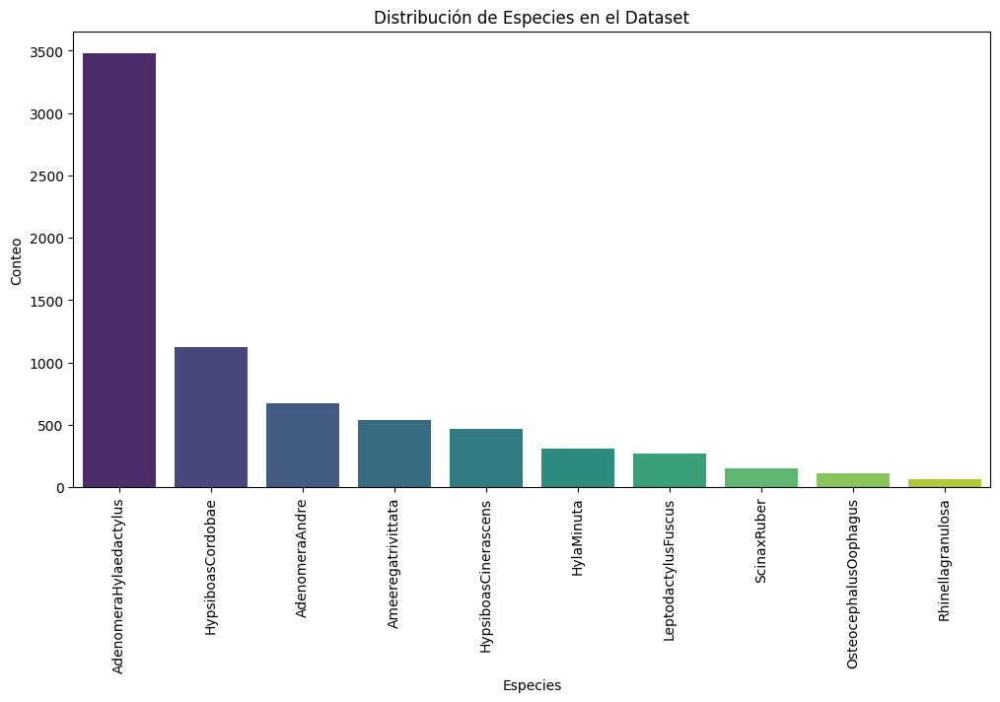

<ipython-input-7-8dc43b307fb1>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=family_counts.index, y=family_counts.values, palette='YlGn')


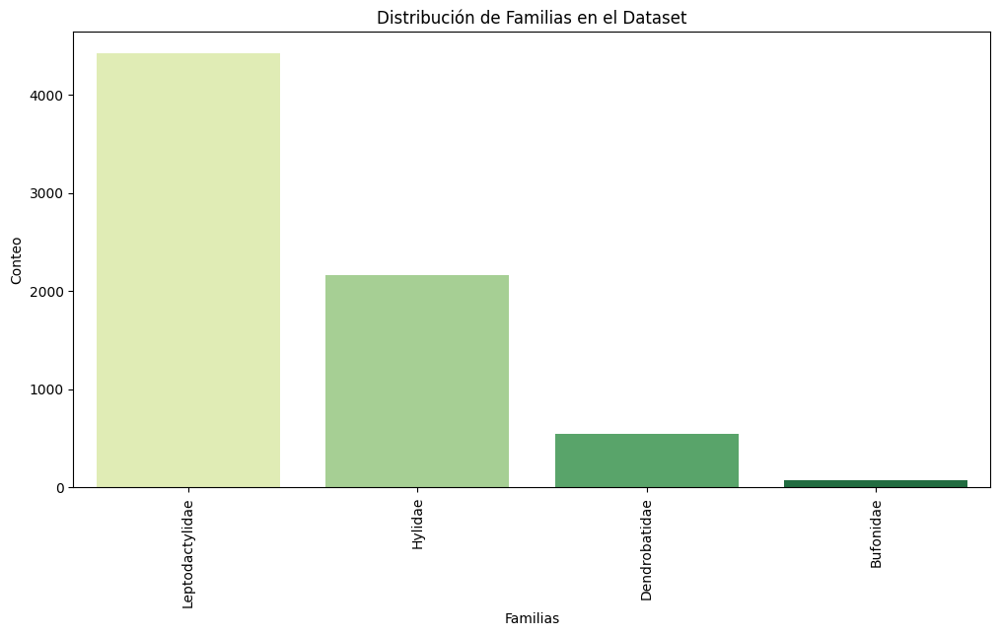

<ipython-input-7-8dc43b307fb1>:32: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=genus_counts.index, y=genus_counts.values, palette='magma')


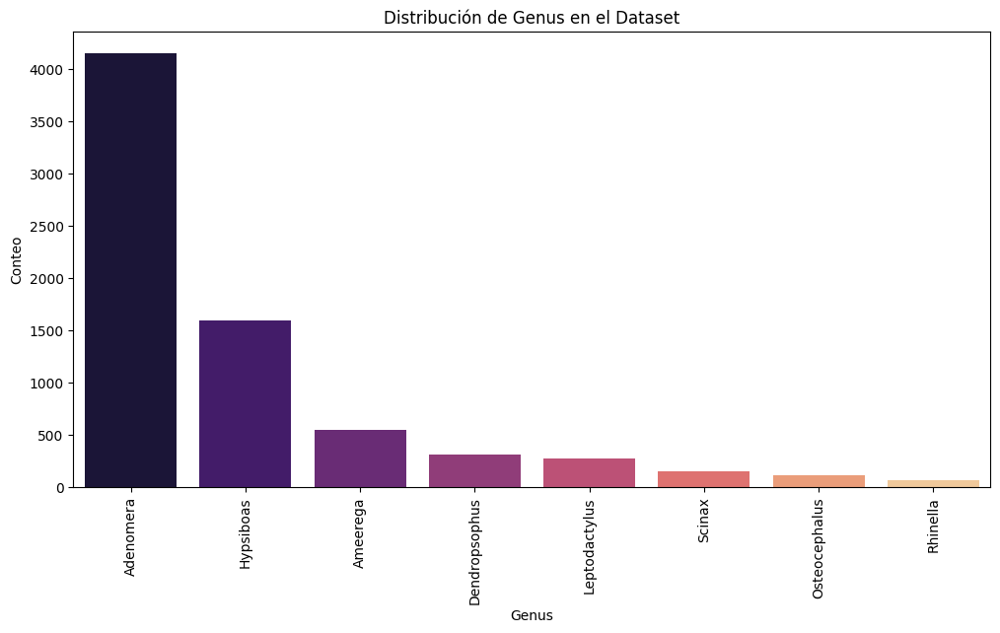

In [ ]:
# Conteo de especies
species_counts = df_frogs['Species'].value_counts()

# Gráfico de barras de la distribución de las especies
plt.figure(figsize=(12, 6))
sns.barplot(x=species_counts.index, y=species_counts.values, palette='viridis')
plt.xticks(rotation=90)
plt.title('Distribución de Especies en el Dataset')
plt.xlabel('Especies')
plt.ylabel('Conteo')
plt.show()


# Conteo de especies
family_counts = df_frogs['Family'].value_counts()

# Gráfico de barras de la distribución de las especies
plt.figure(figsize=(12, 6))
sns.barplot(x=family_counts.index, y=family_counts.values, palette='YlGn')
plt.xticks(rotation=90)
plt.title('Distribución de Familias en el Dataset')
plt.xlabel('Familias')
plt.ylabel('Conteo')
plt.show()


# Conteo de especies
genus_counts = df_frogs['Genus'].value_counts()

# Gráfico de barras de la distribución de las especies
plt.figure(figsize=(12, 6))
sns.barplot(x=genus_counts.index, y=genus_counts.values, palette='magma')
plt.xticks(rotation=90)
plt.title('Distribución de Genus en el Dataset')
plt.xlabel('Genus')
plt.ylabel('Conteo')
plt.show()


En el siguiente apartado del analisis , visulizo los valores entre los que oscila cada uno de los MFCCs.

En el eje "x" de cada gráfica podemos observar los valores de las caracteristicas mientras que el
eje "y" representa el numero de ejemplos para cada uno de los valores de eje x.

Puedo observar que todas las distrubicones en general tiene sentido excepto la primera (MFCCs_1) , en la que podemos ver como la mayor parte de los ejemplos se encuentran en el valor 1 , lo que indica una distrubución que no es uniforme.

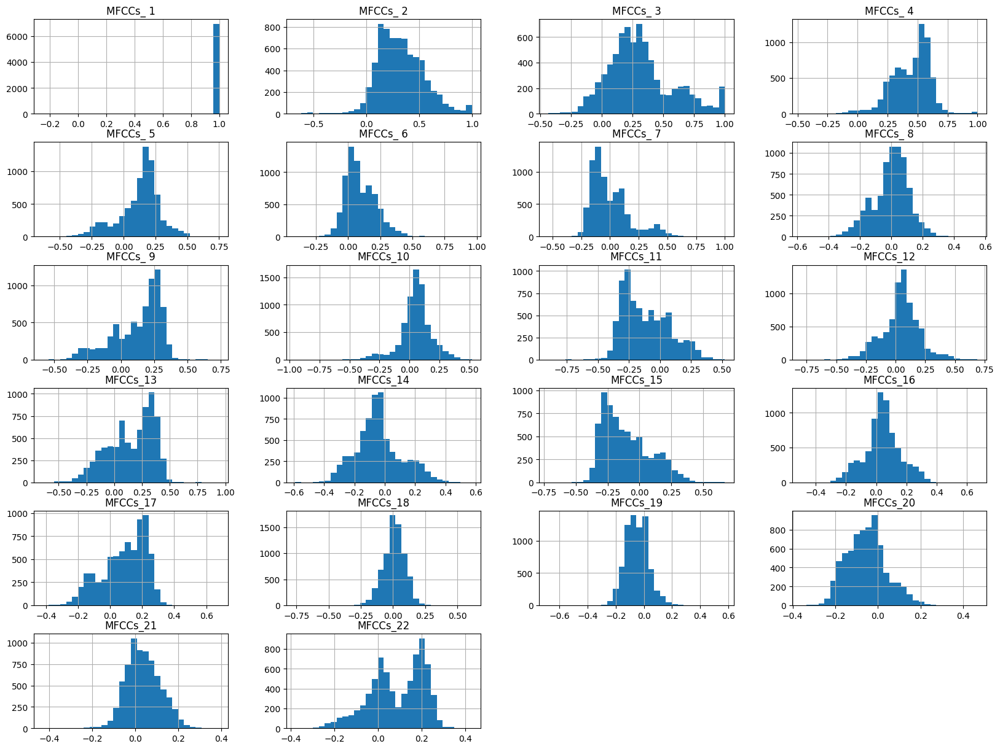

In [ ]:
# Identificar las columnas que contienen los coeficientes MFCCs
mfccs_columns = [col for col in df_frogs.columns if col.startswith('MFCCs_')]

# Generar histogramas de todos los coeficientes MFCCs
df_frogs[mfccs_columns].hist(bins=30, figsize=(20, 15), layout=(6, 4))
plt.show()

# Eliminacion de outliers

Utilizamos el algoritmo isolation forest , para poder obtener los scores de anomalía , a partir de estos scores realizaremos un histograma el cual analizaremos para poder determinar el umbral de detección de outliers

In [ ]:
# Identificar las columnas que contienen los coeficientes MFCCs
mfccs_columns = [col for col in df_frogs.columns if col.startswith('MFCCs_')]

# Inicializar el escalador y escalar los datos
scaler = StandardScaler()
df_frogs_scaled = scaler.fit_transform(df_frogs[mfccs_columns])

# Inicializar el modelo Isolation Forest , para estimar que aproximadamente el 5% de los datos son outliers
iso_forest = IsolationForest(contamination=0.05, random_state=42)

# Entrenamos el modelo y obtener los scores de anomalía
iso_forest.fit(df_frogs_scaled)
scores = iso_forest.decision_function(df_frogs_scaled)
df_frogs['anomaly_score'] = scores

En histogram que se muestra la mayor parte de los scores , se encuentran en un rango específico , mientras que los outliers se encuentran en los extremos de la distribucion

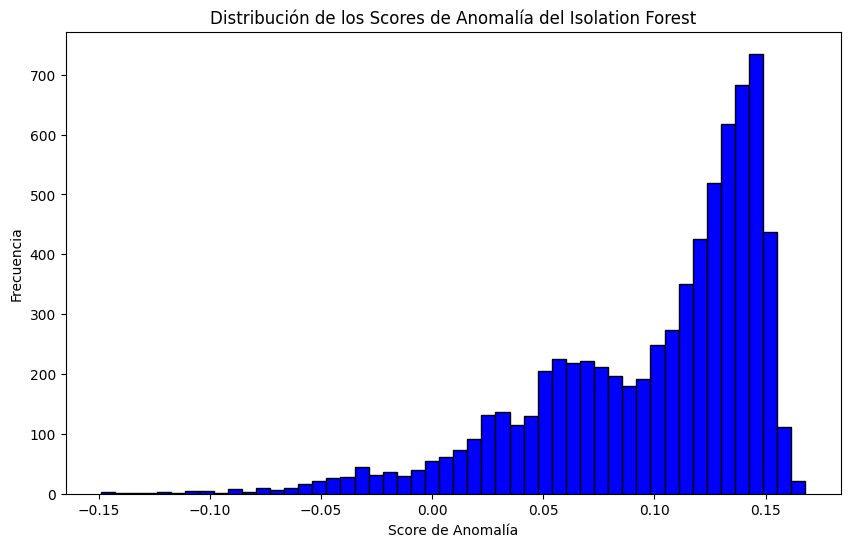

In [ ]:
# Histograma de los scores de anomalía
# En este histograma la mayor parte de los scores , se encuentran en un rango específico , mientras que los
# outliers se encuentran en los extremos de la distribucion
plt.figure(figsize=(10, 6))
plt.hist(df_frogs['anomaly_score'], bins=50, color='blue', edgecolor='black')
plt.title('Distribución de los Scores de Anomalía del Isolation Forest')
plt.xlabel('Score de Anomalía')
plt.ylabel('Frecuencia')
plt.show()

 Usar el 5 como umbral para identificra los casos que son más extremos y asegurarnos de que no eliminemos demasidas observaciones y que sigan estando la mayor parte de los datos , intentado que los datos que eliminemos sean los que más probablidad tengan de ser outliers

El siguiente fragmento de codigo lo he diseñado , para que elimine los outliers y para que muestre por pantalla el numero de los eliminados y las dimension del DataFrame antes y despues .
Tras mostrar esto puedo comprobar que el numero de outliers eliminados no sea excesivamnete grande en proporcion a dimension del Datagrama y que la Dimension del datagrama se ha actualizado correctamente.

In [ ]:
# Determinar el umbral (un percentil específico de los scores)
threshold = np.percentile(scores, 5)

# Identificar los outliers
outliers = df_frogs['anomaly_score'] < threshold

# Contar el número de outliers
num_outliers = outliers.sum()
print(f"Número de outliers detectados: {num_outliers}")

# Eliminar los outliers de df_frogs , eliminamos las filas correspondientes
df_frogs_cleaned = df_frogs[~outliers]

# Verificamos que se han borrado exactamente los outliers calculados
print(f"Dimensiones del DataFrame original: {df_frogs.shape}")
print(f"Dimensiones del DataFrame sin outliers: {df_frogs_cleaned.shape}")

Número de outliers detectados: 360
Dimensiones del DataFrame original: (7195, 27)
Dimensiones del DataFrame sin outliers: (6835, 27)


# APLICAMOS ALGORITMOS

Aplico DBSCAN con distintos eps , para poder determinar el numero de clusters que se forman como maximo con esos epsilon , esto es útil para apartados en los que se quiere saber el silhouette score y la inercia para diferentes numeros de clusters


In [ ]:
# Valores de epsilon (eps)
eps_values = [0.1, 0.2, 0.3, 0.4 ,0.5]
numeric_columns = [col for col in df_frogs_cleaned.columns if col.startswith('MFCCs_')]
df_frogs_cleaned_numeric = df_frogs_cleaned[numeric_columns]

num_clusters = []
# Ajuste de los modelos DBSCAN con diferentes valores de epsilon
plt.figure(figsize=(16, 12))
for i, eps in enumerate(eps_values, 1):
    dbscan = DBSCAN(eps=eps, min_samples=5)
    clusters = dbscan.fit_predict(df_frogs_cleaned_numeric)

    unique_clusters = np.unique(clusters)
    num_clusters.append(len(unique_clusters) -1 if -1 in unique_clusters else len(unique_clusters))

for i, eps in zip(num_clusters, eps_values):
        print("EPS" , eps, "nº clusters-->", i)

EPS 0.1 nº clusters--> 17
EPS 0.2 nº clusters--> 32
EPS 0.3 nº clusters--> 15
EPS 0.4 nº clusters--> 5
EPS 0.5 nº clusters--> 4


<Figure size 1600x1200 with 0 Axes>

Como vemos tenemos como maximo para estos epsilons , un numero de clusters igual a 32 , por lo cual para apartados siguintes utilizare un rango de numero de clusters entre 1 y 40

<font color='violet'>***KMEANS***

Probé a buscar el silohuette score y Calinski-Harabasz ,con diferente numero de n_init y pude obsrvar que para n_init = 10 , 20 , 30 , 40 , 50 , salian las graficas iguales , esto indica que con n_init = 10 ya esta encontrando la mejor solución . Es por ello que voy utilizar n_init = 10

Visualizo para diferente numero de cluster el silohuette score, el Calinski-Harabasz y la inercia , para intentar visulizar cual podria ser el numero de clusters óptimo fijandonos solo en la inecia deberiamos buscar lo llamado "codo" , es decir , ese punto en que la disminución de la inercia empieza a relentizarse , ese sería el numero optimo de clusters teniendo solo en cuenta la inercia ,  mirando unicamente el silohuete score, debemos bustar el punto que mayor silohuette score produce , con Calinski-Harabasz tambien deberiamos buscar el que mayor valor produciese.
Intento visulizar diferentes numeros de cluster teniendo en cuenta la inercia, el silohuette score y el Calinski-Harabasz , para poder trabajar con ellos y ver como se comportan.

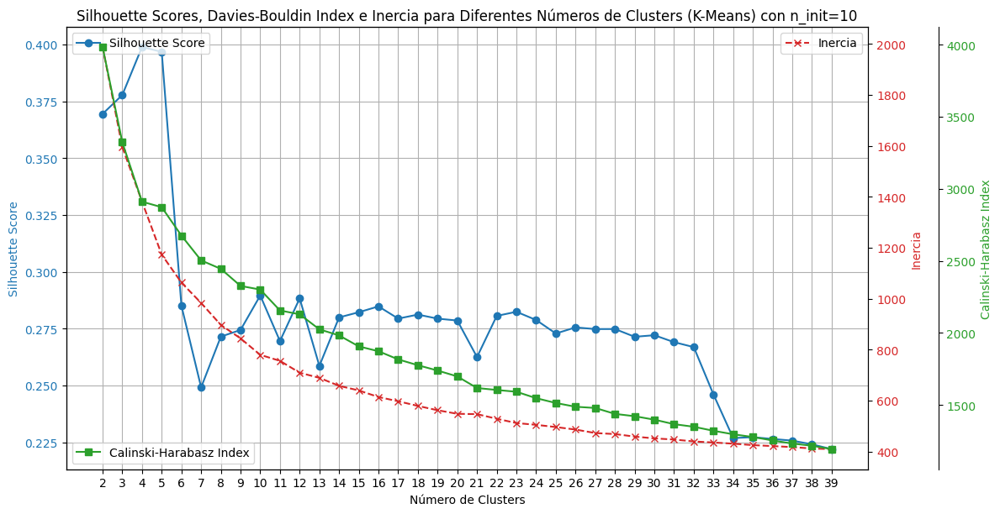

In [ ]:

## Excluir las columnas no numéricas
numeric_columns = [col for col in df_frogs_cleaned.columns if col.startswith('MFCCs_')]
df_frogs_cleaned_numeric = df_frogs_cleaned[numeric_columns]


 # Numero de cluster sobre los cuales vamos a realizar el analisis
num_clusters = list(range(2, 40))

 # Almacen de los silhouette Scores de los diferentes numero de clusters
silhouette_scores = []
inertia_values = []
calinski_harabasz_scores = []

 # Calculo y alamcenamiento de para cada nunero clusters
for k in num_clusters:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init = 10)
    kmeans_labels = kmeans.fit_predict(df_frogs_cleaned_numeric)
    silhouette_scores.append(silhouette_score(df_frogs_cleaned_numeric, kmeans_labels))
    inertia_values.append(kmeans.inertia_)
    calinski_harabasz_scores.append(calinski_harabasz_score(df_frogs_cleaned_numeric, kmeans_labels))


fig, ax1 = plt.subplots(figsize=(12, 6))

color = 'tab:blue'
ax1.set_xlabel('Número de Clusters')
ax1.set_ylabel('Silhouette Score', color=color)
ax1.plot(num_clusters, silhouette_scores, marker='o', color=color, label='Silhouette Score')
ax1.tick_params(axis='y', labelcolor=color)
ax1.legend(loc='upper left')
ax1.grid(True)

# Crear segundo eje y para la inercia
ax2 = ax1.twinx()
color = 'tab:red'
ax2.set_ylabel('Inercia', color=color)
ax2.plot(num_clusters, inertia_values, marker='x', color=color, linestyle='dashed', label='Inercia')
ax2.tick_params(axis='y', labelcolor=color)
ax2.legend(loc='upper right')


# Crear tercer eje y para el Calinski-Harabasz Index
ax3 = ax1.twinx()
color = 'tab:green'
ax3.spines['right'].set_position(('outward', 60))  # Mover el tercer eje a la derecha
ax3.set_ylabel('Calinski-Harabasz Index', color=color)
ax3.plot(num_clusters, calinski_harabasz_scores, marker='s', color=color, label='Calinski-Harabasz Index')
ax3.tick_params(axis='y', labelcolor=color)
ax3.legend(loc='lower left')

# Establecer los ticks del eje x para que muestren todos los valores
ax1.set_xticks(num_clusters)

fig.tight_layout()  # Para que los ejes no se sobrepongan
plt.title('Silhouette Scores, Davies-Bouldin Index e Inercia para Diferentes Números de Clusters (K-Means) con n_init=10')
plt.show()


En la grafica no podemos observar un "codo" claro , pero si podemos ver un tramo donde la inercia empieza a ser menos pronuciada , este tramo se encuentra aproximadamente entre numero de cluster 3 y 5.

Tambien podemos observar que los puntos más altos de silohuette score se dan con un numero de cluster entre 2 y 5 , lo que indica que los clusters estan bien definidos.

Si observamos Calinski-Harabasz Index vemos que obtenemos valores altos para un numero de clusters entre 2 y 5 , esto nos indica que con ese numero de clusters los clusters seran más compactos y estaran más separado entre ellos


En la gráfica tambien se puede observar como tanto el Silhouette Score como el índice de Calinski-Harabasz tienden a estabilizarse a partir de un numero de clusters igual a 10 , lo que sugiere que agregar más clústeres después de este punto no mejora significativamente la calidad del agrupamiento.

Como conclusion y evaluado lo observado en la gráfica creo que los numeros de clusters que tienen la posibilidad de funcionar mejor son los siguientes:

Numero de clusters = 3 , 4
--> Ofrece un buen balance entre una baja inercia y un alto Silhouette Score y Calinski-Harabasz

Voy a probar tambien con Numero de clusters = 5 , creo que este tiene menos posibilidades de ser óptimo debido a que el silohuette score y Calinski-Harabasz bajan ligeramente.


------------------------------------------------------------------------------------------------------------

En los siguintes apartadados ,aplico el modelo Kmeans con 3 ,4 ,5 clusters.

Para cada uno de los numeros de clusters hago lo siguinte:



*   Aplico kMeans con el numero de clusters correspondiente.
*   Entreno el modelo

*   Calculo y muestro inercia , silhouette score y calinski harabasz score

    **NOTA: Simplemente muestro los claculos para comprobar que estos correponde con lo mostrado en la gráfica anterior.**


*   Por útlimo muestro dos gráficas de los clusters formados , una de estas gáficas utiliza PCA y la otra T-SNE.
Estas gáficas serán utiles para poder comprobar a simple vista que numero de clusters parece mejor .
Aparte de PCA he dedidido tambien usar T-SNE , debido a que con esta tecnica de reducción de dimensionalidad se lográ ver mejor como estan los datos agrupados.








***NUMERO DE CLUSTERS = 4***

MOSTRAR DATOS DE LA GRÁFICA

In [ ]:

# Aplicar K-Means
kmeans = KMeans(n_clusters=4, random_state=42, n_init=10)
kmeans_labels = kmeans.fit_predict(df_frogs_cleaned_numeric)

# Evaluar K-Means
kmeans_silhouette = silhouette_score(df_frogs_cleaned_numeric, kmeans_labels)
kmeans_inertia = kmeans.inertia_
kmeans_calinski = calinski_harabasz_score(df_frogs_cleaned_numeric, kmeans_labels)


print(f"K-Means Silhouette Score: {kmeans_silhouette}")
print(f"K-Means inercia: {kmeans_inertia}")
print(f"K-Means calinski_harabasz_score: {kmeans_calinski}")

K-Means Silhouette Score: 0.3989204411220826
K-Means inercia: 1381.0836912928357
K-Means calinski_harabasz_score: 2911.3652783704333


VISUALIZAR CLUSTERS

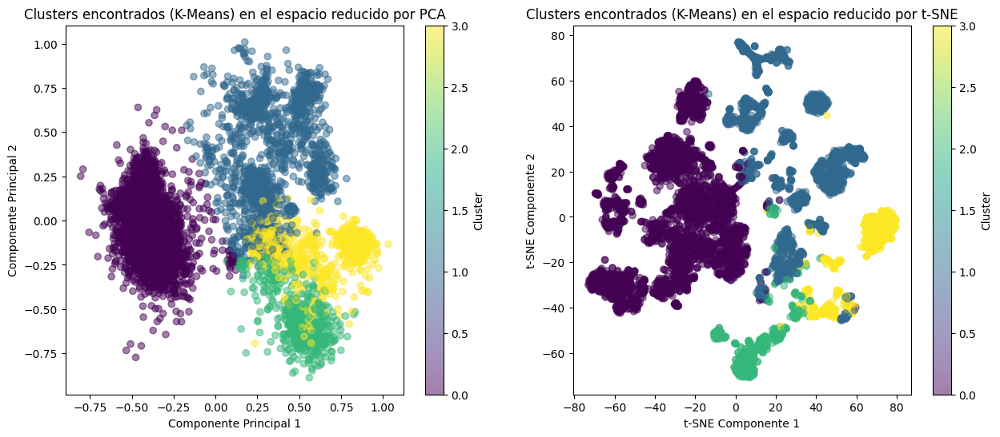

In [ ]:
# Reducción de dimensionalidad con PCA
pca = PCA(n_components=2)
df_frogs_pca = pca.fit_transform(df_frogs_cleaned_numeric)

# Reducción de dimensionalidad con T-SNE
tsne = TSNE(n_components=2, random_state=42)
df_frogs_tsne = tsne.fit_transform(df_frogs_cleaned_numeric)

# Crear figura y subplots
fig, axs = plt.subplots(1, 2, figsize=(15, 6))

# Graficar clusters en el espacio reducido por PCA
scatter_pca = axs[0].scatter(df_frogs_pca[:, 0], df_frogs_pca[:, 1], c=kmeans_labels, cmap='viridis', alpha=0.5)
axs[0].set_title('Clusters encontrados (K-Means) en el espacio reducido por PCA')
axs[0].set_xlabel('Componente Principal 1')
axs[0].set_ylabel('Componente Principal 2')
plt.colorbar(scatter_pca, ax=axs[0], label='Cluster')


# Graficar clusters en el espacio reducido por t-SNE
scatter_tsne = axs[1].scatter(df_frogs_tsne[:, 0], df_frogs_tsne[:, 1], c=kmeans_labels, cmap='viridis', alpha=0.5)
axs[1].set_title('Clusters encontrados (K-Means) en el espacio reducido por t-SNE')
axs[1].set_xlabel('t-SNE Componente 1')
axs[1].set_ylabel('t-SNE Componente 2')
plt.colorbar(scatter_tsne, ax=axs[1], label='Cluster')

# Mostrar gráficos
plt.show()

***NUMERO DE CLUSTERS = 3***

MOSTRAR DATOS DE LA GRÁFICA

In [ ]:
# Aplicar K-Means
kmeans = KMeans(n_clusters=3, random_state=42, n_init=10)
kmeans_labels = kmeans.fit_predict(df_frogs_cleaned_numeric)

# Evaluar K-Means
kmeans_silhouette = silhouette_score(df_frogs_cleaned_numeric, kmeans_labels)
kmeans_inertia = kmeans.inertia_
kmeans_calinski = calinski_harabasz_score(df_frogs_cleaned_numeric, kmeans_labels)


print(f"K-Means Silhouette Score: {kmeans_silhouette}")
print(f"K-Means inercia: {kmeans_inertia}")
print(f"K-Means calinski_harabasz_score: {kmeans_calinski}")

K-Means Silhouette Score: 0.37779765045804536
K-Means inercia: 1595.0375760974878
K-Means calinski_harabasz_score: 3323.6051561950626


VISUALIZAR CLUSTERS

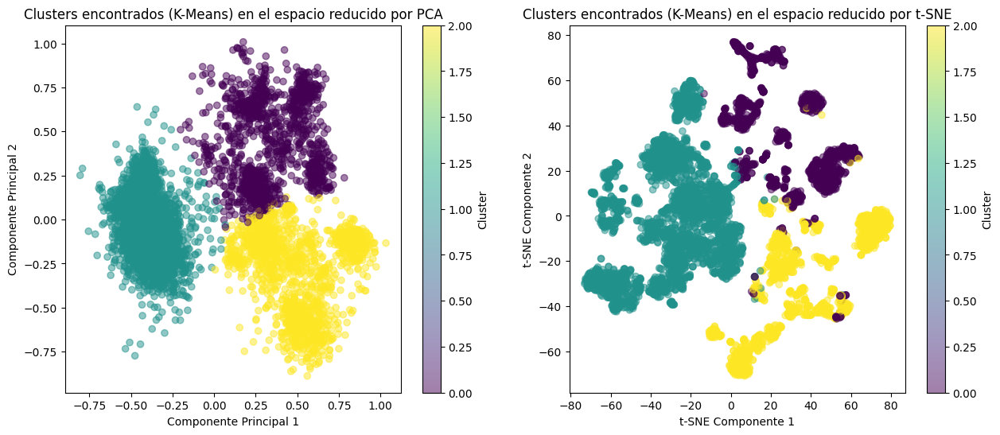

In [ ]:
# Reducción de dimensionalidad con PCA
pca = PCA(n_components=2)
df_frogs_pca = pca.fit_transform(df_frogs_cleaned_numeric)

# Reducción de dimensionalidad con T-SNE
tsne = TSNE(n_components=2, random_state=42)
df_frogs_tsne = tsne.fit_transform(df_frogs_cleaned_numeric)

# Crear figura y subplots
fig, axs = plt.subplots(1, 2, figsize=(15, 6))

# Graficar clusters en el espacio reducido por PCA
scatter_pca = axs[0].scatter(df_frogs_pca[:, 0], df_frogs_pca[:, 1], c=kmeans_labels, cmap='viridis', alpha=0.5)
axs[0].set_title('Clusters encontrados (K-Means) en el espacio reducido por PCA')
axs[0].set_xlabel('Componente Principal 1')
axs[0].set_ylabel('Componente Principal 2')
plt.colorbar(scatter_pca, ax=axs[0], label='Cluster')


# Graficar clusters en el espacio reducido por t-SNE
scatter_tsne = axs[1].scatter(df_frogs_tsne[:, 0], df_frogs_tsne[:, 1], c=kmeans_labels, cmap='viridis', alpha=0.5)
axs[1].set_title('Clusters encontrados (K-Means) en el espacio reducido por t-SNE')
axs[1].set_xlabel('t-SNE Componente 1')
axs[1].set_ylabel('t-SNE Componente 2')
plt.colorbar(scatter_tsne, ax=axs[1], label='Cluster')

# Mostrar gráficos
plt.show()

***NUMERO DE CLUSTERS = 5***

MOSTRAR DATOS DE LA GRÁFICA

In [ ]:
# Aplicar K-Means
kmeans = KMeans(n_clusters=5, random_state=42, n_init=10)
kmeans_labels = kmeans.fit_predict(df_frogs_cleaned_numeric)

# Evaluar K-Means
kmeans_silhouette = silhouette_score(df_frogs_cleaned_numeric, kmeans_labels)
kmeans_inertia = kmeans.inertia_
kmeans_calinski = calinski_harabasz_score(df_frogs_cleaned_numeric, kmeans_labels)


print(f"K-Means Silhouette Score: {kmeans_silhouette}")
print(f"K-Means inercia: {kmeans_inertia}")
print(f"K-Means calinski_harabasz_score: {kmeans_calinski}")

K-Means Silhouette Score: 0.39676622879129947
K-Means inercia: 1173.078916530351
K-Means calinski_harabasz_score: 2873.0854949967056


VISUALIZAR CLUSTERS

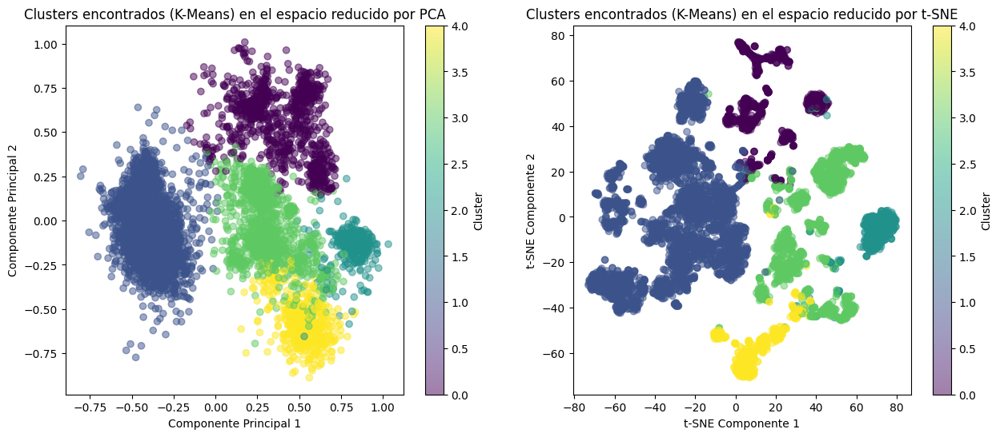

In [ ]:
# Reducción de dimensionalidad con PCA
pca = PCA(n_components=2)
df_frogs_pca = pca.fit_transform(df_frogs_cleaned_numeric)

# Reducción de dimensionalidad con T-SNE
tsne = TSNE(n_components=2, random_state=42)
df_frogs_tsne = tsne.fit_transform(df_frogs_cleaned_numeric)

# Crear figura y subplots
fig, axs = plt.subplots(1, 2, figsize=(15, 6))

# Graficar clusters en el espacio reducido por PCA
scatter_pca = axs[0].scatter(df_frogs_pca[:, 0], df_frogs_pca[:, 1], c=kmeans_labels, cmap='viridis', alpha=0.5)
axs[0].set_title('Clusters encontrados (K-Means) en el espacio reducido por PCA')
axs[0].set_xlabel('Componente Principal 1')
axs[0].set_ylabel('Componente Principal 2')
plt.colorbar(scatter_pca, ax=axs[0], label='Cluster')


# Graficar clusters en el espacio reducido por t-SNE
scatter_tsne = axs[1].scatter(df_frogs_tsne[:, 0], df_frogs_tsne[:, 1], c=kmeans_labels, cmap='viridis', alpha=0.5)
axs[1].set_title('Clusters encontrados (K-Means) en el espacio reducido por t-SNE')
axs[1].set_xlabel('t-SNE Componente 1')
axs[1].set_ylabel('t-SNE Componente 2')
plt.colorbar(scatter_tsne, ax=axs[1], label='Cluster')

# Mostrar gráficos
plt.show()

<font color='violet'>***KMEANS++***

Como segunda opción una vez aplicado kmeans , he intentado aplicar la variante kmeans++ , lo primero que he hecho es mostrar la grafica de la inercia , de silohuette scores y de Calinski-Harabasz, y observandola me doy cuenta que produce unos resultados identicos a kmeans , por lo cual no veo util realizar un analisis con kmeans ++.
Que produzcan el mismo resultado se puede deber a que kmeans tradicional , este convergiendo de una manera efectiva en los datos a pesar de tener inicializacion aleatoria , y puede ser por eso que consiga una solucion igual en kmeans(tradicional) y kmeans++ .

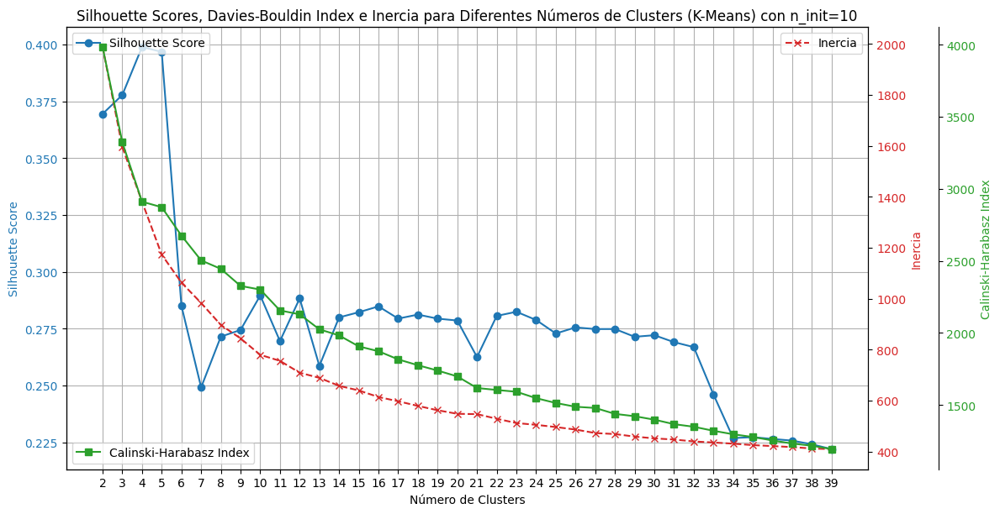

In [ ]:

## Excluir las columnas no numéricas
numeric_columns = [col for col in df_frogs_cleaned.columns if col.startswith('MFCCs_')]
df_frogs_cleaned_numeric = df_frogs_cleaned[numeric_columns]


 # Numero de cluster sobre los cuales vamos a realizar el analisis
num_clusters = list(range(2, 40))

 # Almacen de los silhouette Scores de los diferentes numero de clusters
silhouette_scores = []
inertia_values = []
calinski_harabasz_scores = []

 # Calculo y alamcenamiento de para cada nunero clusters
for k in num_clusters:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init = 10, init = 'k-means++')
    kmeans_labels = kmeans.fit_predict(df_frogs_cleaned_numeric)
    silhouette_scores.append(silhouette_score(df_frogs_cleaned_numeric, kmeans_labels))
    inertia_values.append(kmeans.inertia_)
    calinski_harabasz_scores.append(calinski_harabasz_score(df_frogs_cleaned_numeric, kmeans_labels))


fig, ax1 = plt.subplots(figsize=(12, 6))

color = 'tab:blue'
ax1.set_xlabel('Número de Clusters')
ax1.set_ylabel('Silhouette Score', color=color)
ax1.plot(num_clusters, silhouette_scores, marker='o', color=color, label='Silhouette Score')
ax1.tick_params(axis='y', labelcolor=color)
ax1.legend(loc='upper left')
ax1.grid(True)

# Crear segundo eje y para la inercia
ax2 = ax1.twinx()
color = 'tab:red'
ax2.set_ylabel('Inercia', color=color)
ax2.plot(num_clusters, inertia_values, marker='x', color=color, linestyle='dashed', label='Inercia')
ax2.tick_params(axis='y', labelcolor=color)
ax2.legend(loc='upper right')


# Crear tercer eje y para el Calinski-Harabasz Index
ax3 = ax1.twinx()
color = 'tab:green'
ax3.spines['right'].set_position(('outward', 60))  # Mover el tercer eje a la derecha
ax3.set_ylabel('Calinski-Harabasz Index', color=color)
ax3.plot(num_clusters, calinski_harabasz_scores, marker='s', color=color, label='Calinski-Harabasz Index', linestyle='-')
ax3.tick_params(axis='y', labelcolor=color)
ax3.legend(loc='lower left')

# Establecer los ticks del eje x para que muestren todos los valores
ax1.set_xticks(num_clusters)

fig.tight_layout()  # Para que los ejes no se sobrepongan
plt.title('Silhouette Scores, Davies-Bouldin Index e Inercia para Diferentes Números de Clusters (K-Means) con n_init=10')
plt.show()


<font color='violet'>***AGGLOMERATIVE CLUSTERING***

En AGGLOMERATIVE CLUSTERING no hay inercia , es por ellos que solo me fijo en el silhouette score y Calinski-Harabasz

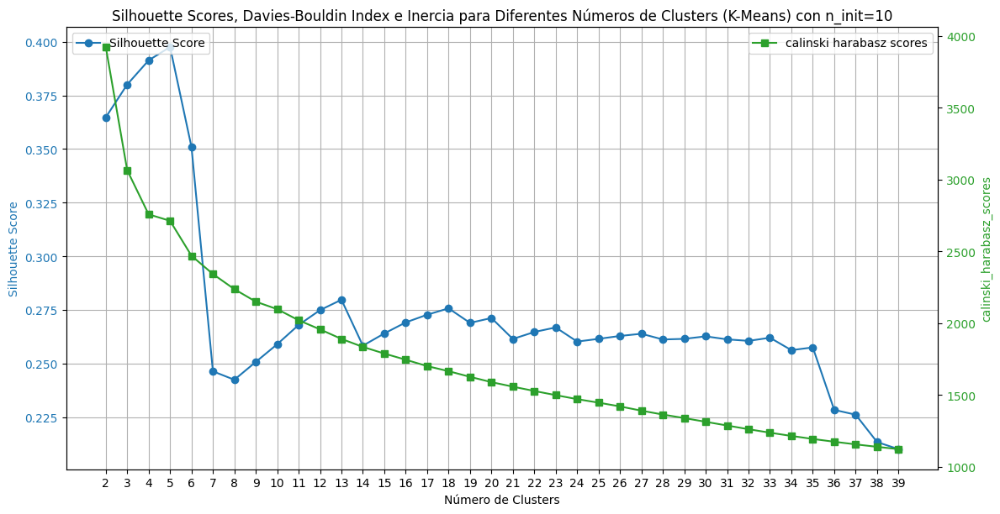

In [ ]:
## Excluir las columnas no numéricas
numeric_columns = [col for col in df_frogs_cleaned.columns if col.startswith('MFCCs_')]
df_frogs_cleaned_numeric = df_frogs_cleaned[numeric_columns]


 # Numero de cluster sobre los cuales vamos a realizar el analisis
num_clusters = list(range(2, 40))

 # Almacen de los silhouette Scores de los diferentes numero de clusters
silhouette_scores = []
calinski_harabasz_scores = []

 # Calculo y alamcenamiento de para cada nunero clusters
for k in num_clusters:
    agglo = AgglomerativeClustering(n_clusters=k)
    agglo_labels = agglo.fit_predict(df_frogs_cleaned_numeric)
    silhouette_scores.append(silhouette_score(df_frogs_cleaned_numeric, agglo_labels))
    calinski_harabasz_scores.append(calinski_harabasz_score(df_frogs_cleaned_numeric, agglo_labels))


fig, ax1 = plt.subplots(figsize=(12, 6))

color = 'tab:blue'
ax1.set_xlabel('Número de Clusters')
ax1.set_ylabel('Silhouette Score', color=color)
ax1.plot(num_clusters, silhouette_scores, marker='o', color=color, label='Silhouette Score')
ax1.tick_params(axis='y', labelcolor=color)
ax1.legend(loc='upper left')
ax1.grid(True)

# Crear segundo eje y para la inercia
ax2 = ax1.twinx()
color = 'tab:green'
ax2.set_ylabel('calinski_harabasz_scores', color=color)
ax2.plot(num_clusters, calinski_harabasz_scores, marker='s', color=color, label='calinski harabasz scores')
ax2.tick_params(axis='y', labelcolor=color)
ax2.legend(loc='upper right')

# Establecer los ticks del eje x para que muestren todos los valores
ax1.set_xticks(num_clusters)

fig.tight_layout()  # Para que los ejes no se sobrepongan
plt.title('Silhouette Scores, Davies-Bouldin Index e Inercia para Diferentes Números de Clusters (K-Means) con n_init=10')
plt.show()


Podemos observar que el puntos más alto de silohuette score se da con un numero de cluster igual a 5 , lo que indica que los clusters estan bien definidos.

Si observamos Calinski-Harabasz Index vemos que obtenemos valores altos para un numero de clusters entre 2 y 5 , esto nos indica que con ese numero de clusters los clusters seran más compactos y estaran más separado entre ellos

En la gráfica tambien se puede observar como tanto el Silhouette Score como el índice de Calinski-Harabasz tienden a estabilizarse a partir de un numero de clusters igual a 11 , lo que sugiere que agregar más clústeres después de este punto no mejora significativamente la calidad del agrupamiento.

Como conclusion y evaluado lo observado en la gráfica creo que el numero de cluster que tienen la posibilidad de funcionar mejor es 5 , debido a que con este numero de clusters conseguimos el mayor valor de silhouette score y tambien obtenemos un valor alto de alinski harabasz score , todo esto indica que es posible que estos 5 clusters esten bien definidos y sean compactos.

En los siguintes apartadados ,aplico el modelo Agglomerative clustering con 5 clusters.


*   Aplico Agglomerative clustering con el numero de clusters correspondiente.
*   Entreno el modelo

*   Calculo y muestro  silhouette score y calinski harabasz score

    **NOTA: Simplemente muestro los calculos para comprobar que estos correponde con lo mostrado en la gráfica anterior.**


*   Por útlimo muestro dos gráficas de los clusters formados , una de estas gáficas utiliza PCA y la otra T-SNE.
Estas gráficas serán utiles para poder comprobar a simple vista el la formacion de clusters .
Aparte de PCA he dedidido tambien usar T-SNE , debido a que con esta tecnica de reducción de dimensionalidad se lográ ver mejor como estan los datos agrupados.






In [ ]:
agglo = AgglomerativeClustering(n_clusters=5)
agglo_labels = agglo.fit_predict(df_frogs_cleaned_numeric)

# Evaluar el modelo
agglo_silhouette = silhouette_score(df_frogs_cleaned_numeric, agglo_labels)
agglo_calinski = calinski_harabasz_score(df_frogs_cleaned_numeric, agglo_labels)


print(f"K-Means Silhouette Score: {agglo_silhouette}")
print(f"K-Means calinski_harabasz_score: {agglo_calinski}")

K-Means Silhouette Score: 0.39753779442707504
K-Means calinski_harabasz_score: 2712.6604401687778


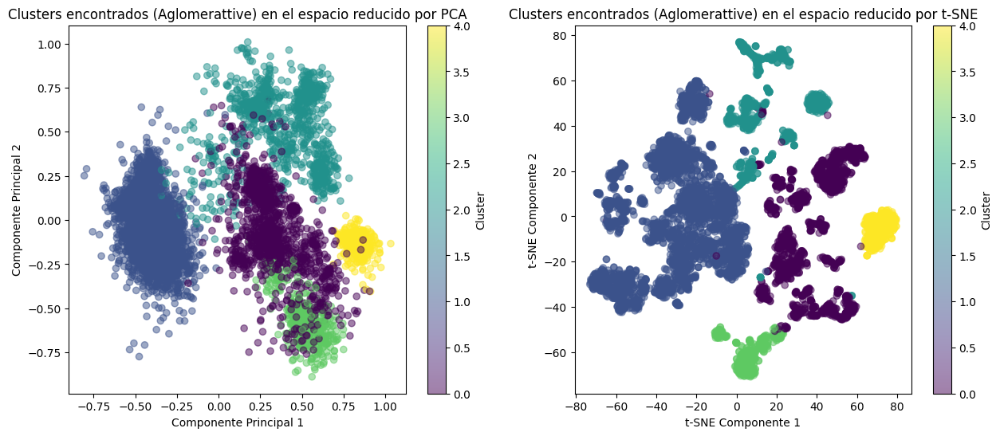

In [ ]:
# Reducción de dimensionalidad con PCA
pca = PCA(n_components=2)
df_frogs_pca = pca.fit_transform(df_frogs_cleaned_numeric)
# Reducción de dimensionalidad con T-SNE
tsne = TSNE(n_components=2, random_state=42)
df_frogs_tsne = tsne.fit_transform(df_frogs_cleaned_numeric)

# Crear figura y subplots
fig, axs = plt.subplots(1, 2, figsize=(15, 6))

# Graficar clusters en el espacio reducido por PCA
scatter_pca = axs[0].scatter(df_frogs_pca[:, 0], df_frogs_pca[:, 1], c=agglo_labels, cmap='viridis', alpha=0.5)
axs[0].set_title('Clusters encontrados (Aglomerattive) en el espacio reducido por PCA')
axs[0].set_xlabel('Componente Principal 1')
axs[0].set_ylabel('Componente Principal 2')
plt.colorbar(scatter_pca, ax=axs[0], label='Cluster')


# Graficar clusters en el espacio reducido por t-SNE
scatter_tsne = axs[1].scatter(df_frogs_tsne[:, 0], df_frogs_tsne[:, 1], c=agglo_labels, cmap='viridis', alpha=0.5)
axs[1].set_title('Clusters encontrados (Aglomerattive) en el espacio reducido por t-SNE')
axs[1].set_xlabel('t-SNE Componente 1')
axs[1].set_ylabel('t-SNE Componente 2')
plt.colorbar(scatter_tsne, ax=axs[1], label='Cluster')

# Mostrar gráficos
plt.show()

<font color='violet'>***GUSSIANMIXTURE***

Breve explicación del algoritmo

El Gaussian Mixture Model(GMM) es un algoritmo de clustering que es muy útil cuando tus dats forman grupos con diferentes formas y tamaños.

GMM funciona asumiendo que los datos provienen de una combinación de varias distribuciones Gaussianas (normales). Para encontrar estos clusters, usa un proceso iterativo llamado Expectation-Maximization. Primero, el algoritmo adivina los parámetros de las Gaussianas, como la media y la covarianza. Luego, calcula la probabilidad de que cada punto de datos pertenezca a cada cluster. Estas probabilidades se usan para ajustar los parámetros de las Gaussianas. Este ciclo se repite hasta que los parámetros se estabilizan.

Una ventaja de GMM es que, además de asignar puntos a clusters, proporciona probabilidades de pertenencia, dando una mayor visión de los datos. Sin embargo, GMM es más complejo y requiere bastante poder computacional.

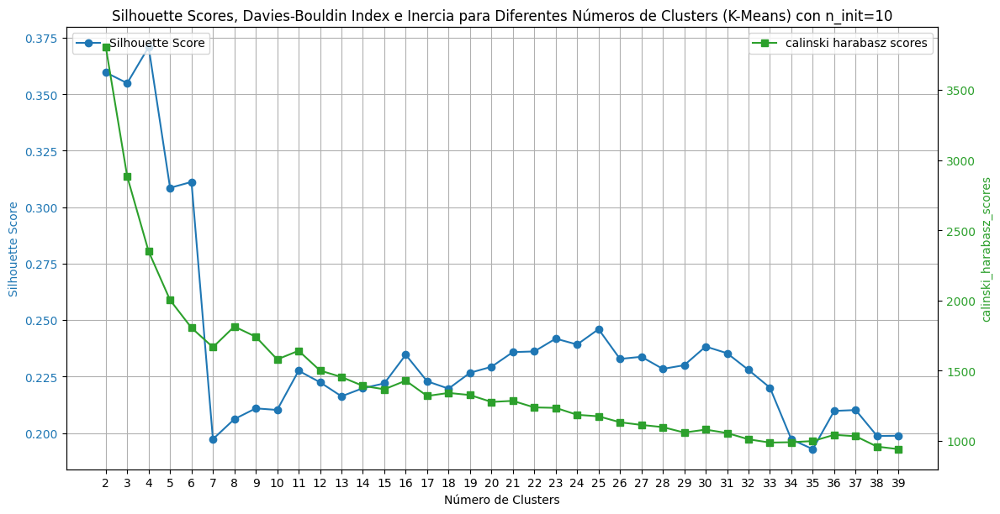

In [ ]:
import pandas as pd
import numpy as np
from sklearn.mixture import GaussianMixture
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt

# Excluir las columnas no numéricas
numeric_columns = [col for col in df_frogs_cleaned.columns if col.startswith('MFCCs_')]
df_frogs_cleaned_numeric = df_frogs_cleaned[numeric_columns]

# Número de componentes sobre los cuales vamos a realizar el análisis
num_clusters = list(range(2, 40))

# Almacén de los Silhouette Scores y calinski_harabasz_scores
silhouette_scores = []
calinski_harabasz_scores = []


# Cálculo y almacenamiento para cada número de componentes
for k in num_clusters:
    gmm = GaussianMixture(n_components=k, random_state=42)
    gmm_labels = gmm.fit_predict(df_frogs_cleaned_numeric)
    silhouette_scores.append(silhouette_score(df_frogs_cleaned_numeric, gmm_labels))
    calinski_harabasz_scores.append(calinski_harabasz_score(df_frogs_cleaned_numeric, gmm_labels))

fig, ax1 = plt.subplots(figsize=(12, 6))

color = 'tab:blue'
ax1.set_xlabel('Número de Clusters')
ax1.set_ylabel('Silhouette Score', color=color)
ax1.plot(num_clusters, silhouette_scores, marker='o', color=color, label='Silhouette Score')
ax1.tick_params(axis='y', labelcolor=color)
ax1.legend(loc='upper left')
ax1.grid(True)

# Crear segundo eje y para la inercia
ax2 = ax1.twinx()
color = 'tab:green'
ax2.set_ylabel('calinski_harabasz_scores', color=color)
ax2.plot(num_clusters, calinski_harabasz_scores, marker='s', color=color, label='calinski harabasz scores')
ax2.tick_params(axis='y', labelcolor=color)
ax2.legend(loc='upper right')

# Establecer los ticks del eje x para que muestren todos los valores
ax1.set_xticks(num_clusters)

fig.tight_layout()  # Para que los ejes no se sobrepongan
plt.title('Silhouette Scores, Davies-Bouldin Index e Inercia para Diferentes Números de Clusters (K-Means) con n_init=10')
plt.show()


Podemos observar que el puntos más alto de silohuette score se da con un numero de cluster igual a 4 , lo que indica que los clusters estan bien definidos.

Si observamos Calinski-Harabasz Index vemos que obtenemos valores altos para un numero de clusters entre 2 y aproximadamente 4 clusters , esto nos indica que con ese numero de clusters los clusters seran más compactos y estaran más separado entre ellos


Como conclusion y evaluado lo observado en la gráfica creo que el numero de cluster que tienen la posibilidad de funcionar mejor es 4 , debido a que con este numero de clusters conseguimos el mayor valor de silhouette score y tambien obtenemos un valor alto de calinski harabasz score , todo esto indica que es posible que estos 4 clusters esten bien definidos y sean compactos.

En los siguintes apartadados ,aplico el modelo Agglomerative clustering con 4 clusters.


*   Aplico GGM con el numero de clusters correspondiente.
*   Entreno el modelo

*   Calculo y muestro  silhouette score y calinski harabasz score

    **NOTA: Simplemente muestro los calculos para comprobar que estos correponde con lo mostrado en la gráfica anterior.**


*   Por útlimo muestro dos gráficas de los clusters formados , una de estas gáficas utiliza PCA y la otra T-SNE.
Estas gráficas serán utiles para poder comprobar a simple vista el la formacion de clusters .
Aparte de PCA he dedidido tambien usar T-SNE , debido a que con esta tecnica de reducción de dimensionalidad se lográ ver mejor como estan los datos agrupados.




In [ ]:

gmm = GaussianMixture(n_components=4, random_state=42)
gmm_labels = gmm.fit_predict(df_frogs_cleaned_numeric)


# Evaluar el modelo
gmm_silhouette = silhouette_score(df_frogs_cleaned_numeric, gmm_labels)
gmm_calinski = calinski_harabasz_score(df_frogs_cleaned_numeric, gmm_labels)


print(f"GaussianMixture Silhouette Score: {gmm_silhouette}")
print(f"GaussianMixture calinski_harabasz_score: {gmm_calinski}")


GaussianMixture Silhouette Score: 0.37093040934578125
GaussianMixture calinski_harabasz_score: 2349.0541542364945


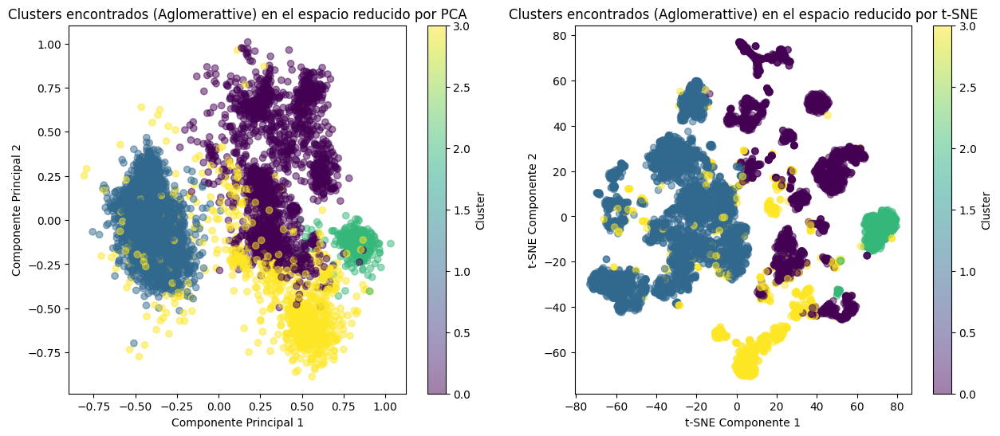

In [ ]:
# Reducción de dimensionalidad con PCA
pca = PCA(n_components=2)
df_frogs_pca = pca.fit_transform(df_frogs_cleaned_numeric)

tsne = TSNE(n_components=2, random_state=42)
df_frogs_tsne = tsne.fit_transform(df_frogs_cleaned_numeric)

# Crear figura y subplots
fig, axs = plt.subplots(1, 2, figsize=(15, 6))

# Graficar clusters en el espacio reducido por PCA
scatter_pca = axs[0].scatter(df_frogs_pca[:, 0], df_frogs_pca[:, 1], c=gmm_labels, cmap='viridis', alpha=0.5)
axs[0].set_title('Clusters encontrados (Aglomerattive) en el espacio reducido por PCA')
axs[0].set_xlabel('Componente Principal 1')
axs[0].set_ylabel('Componente Principal 2')
plt.colorbar(scatter_pca, ax=axs[0], label='Cluster')


# Graficar clusters en el espacio reducido por t-SNE
scatter_tsne = axs[1].scatter(df_frogs_tsne[:, 0], df_frogs_tsne[:, 1], c=gmm_labels, cmap='viridis', alpha=0.5)
axs[1].set_title('Clusters encontrados (Aglomerattive) en el espacio reducido por t-SNE')
axs[1].set_xlabel('t-SNE Componente 1')
axs[1].set_ylabel('t-SNE Componente 2')
plt.colorbar(scatter_tsne, ax=axs[1], label='Cluster')

# Mostrar gráficos
plt.show()

# COMPARATIVA DE ALGORITMOS

Vamos a ver en este apartado como funcionan los algoritmos aplicados anteriormente , para ello veremos como se adaptan cada uno de ellos a las etiquetas reales , utilizando diferentes tipos de tecnicas.

Voy a seguir el mismo procedimiento para todos los algoritmos , el cual es el siguintes:


*   Mostrar grafica de etiquetas (Especies,familias y generos) Reales y a su lado grafica de los cluster que forma el modelo correspondiente, lo hago tanto en PCA y T-SNE.



*   Hago uso del ARI como paso final para ver la similitud entre los clusters obtenidos y los clusters verdaderos.
El valor de ARI oscilará entre -1 y 1 , donde 1 indica una correspondencia perfecta entre los clústeres encontrados y los verdaderos.

Aplicaré el ARI para cada modelo y a su vez para FAMILA , GENERO y ESPECIES

In [ ]:
# Excluir las columnas no numéricas
numeric_columns = [col for col in df_frogs_cleaned.columns if col.startswith('MFCCs_')]
df_frogs_cleaned_numeric = df_frogs_cleaned[numeric_columns]

In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder
from sklearn.cluster import KMeans, AgglomerativeClustering
from sklearn.mixture import GaussianMixture
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt


# Inicializar el codificador de etiquetas
label_encoder_species = LabelEncoder()
label_encoder_family = LabelEncoder()
label_encoder_genus = LabelEncoder()
# Codificar las etiquetas de las especies
encoded_labels_species = label_encoder_species.fit_transform(df_frogs_cleaned['Species'])
encoded_labels_family = label_encoder_family.fit_transform(df_frogs_cleaned['Family'])
encoded_labels_genus = label_encoder_genus.fit_transform(df_frogs_cleaned['Genus'])
# Diccionario para mapear las etiquetas codificadas a los nombres de especies, esto es necesario para poder ver el la leyenda el nombre de las especies
label_to_species = dict(zip(range(len(label_encoder_species.classes_)), label_encoder_species.classes_))
label_to_family = dict(zip(range(len(label_encoder_family.classes_)), label_encoder_family.classes_))
label_to_genus = dict(zip(range(len(label_encoder_genus.classes_)), label_encoder_genus.classes_))


# Reducción de dimensionalidad con PCA
pca = PCA(n_components=2)
df_frogs_pca = pca.fit_transform(df_frogs_cleaned_numeric)

tsne = TSNE(n_components=2, random_state=42)
df_frogs_tsne = tsne.fit_transform(df_frogs_cleaned_numeric)

# Función para crear scatter plots con leyendas
def create_scatter(ax, labels, title, colorbar_label, cmap):
    scatter = ax.scatter(df_frogs_pca[:, 0], df_frogs_pca[:, 1], c=labels, cmap=cmap, alpha=0.5)
    ax.set_title(title)
    ax.set_xlabel('Componente Principal 1')
    ax.set_ylabel('Componente Principal 2')
    fig.colorbar(scatter, ax=ax, label=colorbar_label)
    return scatter

# Función para crear scatter plots con leyendas
def create_scatter_tsne(ax, labels, title, colorbar_label, cmap):
    scatter = ax.scatter(df_frogs_tsne[:, 0], df_frogs_tsne[:, 1], c=labels, cmap=cmap, alpha=0.5)
    ax.set_title(title)
    ax.set_xlabel('Componente Principal 1')
    ax.set_ylabel('Componente Principal 2')
    fig.colorbar(scatter, ax=ax, label=colorbar_label)
    return scatter


COMPARACION DE ETIQUETAS DE ESPECIES , FAMILIA Y GENEROS PARA KMEANS CON 4 CLUSTERS

**NOTA:Lo hago solo con 4 clusters debido a que , he determinado observando las diferentes graficas del apartado anterior (donde aplico kmeans y muestro las graficas con diferente numero de clusters) ,que con 4 clusters es maś probable que Kmeans funcione mejor frente al conjunto de datos sobre el que trabajamos.**

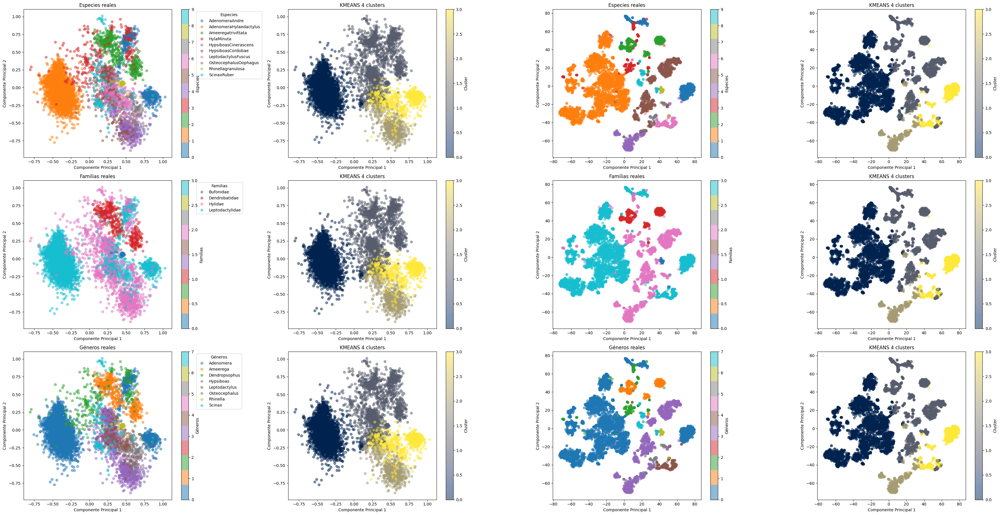

In [ ]:

# Crear la figura y los ejes
fig, axs = plt.subplots(3, 4, figsize=(35, 18))


# Graficar las etiquetas reales de las especies
scatter_species = create_scatter(axs[0, 0], encoded_labels_species, 'Especies reales', 'Especies', 'tab10')
handles_species, _ = scatter_species.legend_elements(prop="colors")
legend_labels_species = [label_to_species[i] for i in range(len(label_encoder_species.classes_))]
axs[0, 0].legend(handles_species, legend_labels_species, title="Especies", bbox_to_anchor=(1.15, 1), loc='upper left')

# Graficar las etiquetas reales de las familias
scatter_family = create_scatter(axs[1, 0], encoded_labels_family, 'Familias reales', 'Familias', 'tab10' )
handles_family, _ = scatter_family.legend_elements(prop="colors")
legend_labels_family = [label_to_family[i] for i in range(len(label_encoder_family.classes_))]
axs[1, 0].legend(handles_family, legend_labels_family, title="Familias", bbox_to_anchor=(1.15, 1), loc='upper left')

# Graficar las etiquetas reales de los géneros
scatter_genus = create_scatter(axs[2, 0], encoded_labels_genus, 'Géneros reales', 'Géneros', 'tab10')
handles_genus, _ = scatter_genus.legend_elements(prop="colors")
legend_labels_genus = [label_to_genus[i] for i in range(len(label_encoder_genus.classes_))]
axs[2, 0].legend(handles_genus, legend_labels_genus, title="Géneros", bbox_to_anchor=(1.15, 1), loc='upper left')

# Modelado con KMeans
kmeans2 = KMeans(n_clusters=4, random_state=42, n_init=10)
kmeans2.fit(df_frogs_cleaned_numeric)
kmeans_labels2 = kmeans2.predict(df_frogs_cleaned_numeric)

# Graficar los clusters de KMeans
scatter_kmeans2 = create_scatter(axs[0, 1], kmeans_labels2, 'KMEANS 4 clusters', 'Cluster','cividis')
scatter_kmeans2 = create_scatter(axs[1, 1], kmeans_labels2, 'KMEANS 4 clusters', 'Cluster','cividis')
scatter_kmeans2 = create_scatter(axs[2, 1], kmeans_labels2, 'KMEANS 4 clusters', 'Cluster','cividis')


scatter_species = create_scatter_tsne(axs[0, 2], encoded_labels_species, 'Especies reales', 'Especies', 'tab10')
handles_species, _ = scatter_species.legend_elements(prop="colors")
legend_labels_species = [label_to_species[i] for i in range(len(label_encoder_species.classes_))]
axs[0, 0].legend(handles_species, legend_labels_species, title="Especies", bbox_to_anchor=(1.15, 1), loc='upper left')

# Graficar las etiquetas reales de las familias
scatter_family = create_scatter_tsne(axs[1, 2], encoded_labels_family, 'Familias reales', 'Familias', 'tab10' )
handles_family, _ = scatter_family.legend_elements(prop="colors")
legend_labels_family = [label_to_family[i] for i in range(len(label_encoder_family.classes_))]
axs[1, 0].legend(handles_family, legend_labels_family, title="Familias", bbox_to_anchor=(1.15, 1), loc='upper left')

# Graficar las etiquetas reales de los géneros
scatter_genus = create_scatter_tsne(axs[2, 2], encoded_labels_genus, 'Géneros reales', 'Géneros', 'tab10')
handles_genus, _ = scatter_genus.legend_elements(prop="colors")
legend_labels_genus = [label_to_genus[i] for i in range(len(label_encoder_genus.classes_))]
axs[2, 0].legend(handles_genus, legend_labels_genus, title="Géneros", bbox_to_anchor=(1.15, 1), loc='upper left')


# Modelado con KMeans
kmeans2 = KMeans(n_clusters=4, random_state=42, n_init=10)
kmeans2.fit(df_frogs_cleaned_numeric)
kmeans_labels2 = kmeans2.predict(df_frogs_cleaned_numeric)

# Graficar los clusters de KMeans
scatter_kmeans2 = create_scatter_tsne(axs[0, 3], kmeans_labels2, 'KMEANS 4 clusters', 'Cluster','cividis')
scatter_kmeans2 = create_scatter_tsne(axs[1, 3], kmeans_labels2, 'KMEANS 4 clusters', 'Cluster','cividis')
scatter_kmeans2 = create_scatter_tsne(axs[2, 3], kmeans_labels2, 'KMEANS 4 clusters', 'Cluster','cividis')

plt.tight_layout()
plt.show()


<font color='Orange'>**Especies:**

En cuanto a las especies Kmeans logra identificar bastante bien a la especie AdenomeraHylaedactylus(Cluster Azul) y tambien lográ identificar bastante bien a la especie HypsiboasCinerascens (Cluster Marron) .

Se puede observar que la etiquetas de especie Ameeregatrivittata, si son reconocidas como que pertenecen a la misma especie , pero esta famila es confundida con familas como HylaMinuta , AdenomeraAndre... etc(Clusters gris)

En el clusters amarillo se puede observar como se distingue en su mayoria la especie LeptodactylusFuscus , pero esta a su vez es confundida con parte de la famila AdenomeraAndree.

<font color='Orange'>**Familias:**

En cuanto a las familias Kmeans logra identificar gran parte de Leptodactylidae como uan familia unica , pero no logra identificar la famlia perfectamente(Cluster Azul)

Se puede observar como las etiquetas de la familia Dendrobatidae , son reconocidas como que pertenecen a la misma famila , pero estas son confundidas mayoritariamente con etiquetas de la famila Hylidae.(Cluster gris)

Podemos ver que otra parte de la famila Leptodactylidae, es identificada como una famila distinta (cluster amarillo)

Por ultimo observamos en el clusters marron un grupo de la familia Hylidae que tanbien se identifica como una famila diferente.


<font color='Orange'>**Generos**

En cuanto a los géneros vemos que Adenomera , es su gran parte esta diferenciado(cluster Azul)

Podemos observar como una pequeña parte de Adenomera , es confundida con Leptodactylus(cluster amarillo)
En el cluster amarillo tambien nos indica que las etiquetas de Leptodactylus, estan todas identificadas como una misma famila ,  a pesar de estar confundidas con Adenomera.

Los demás generos por lo general se confunden entre ellos , esto lo indican los clusters gris y marron.

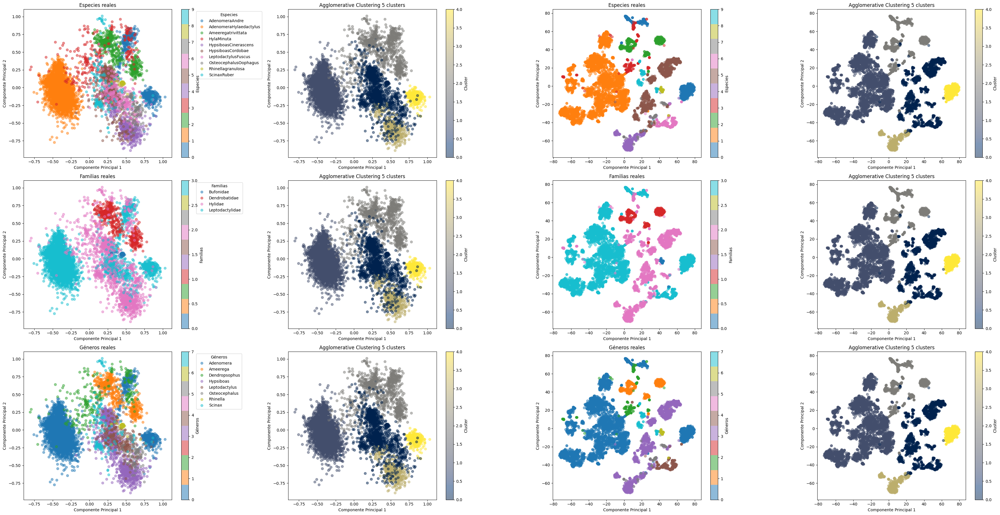

In [ ]:

# Crear la figura y los ejes
fig, axs = plt.subplots(3, 4, figsize=(35, 18))


# Graficar las etiquetas reales de las especies
scatter_species = create_scatter(axs[0, 0], encoded_labels_species, 'Especies reales', 'Especies', 'tab10')
handles_species, _ = scatter_species.legend_elements(prop="colors")
legend_labels_species = [label_to_species[i] for i in range(len(label_encoder_species.classes_))]
axs[0, 0].legend(handles_species, legend_labels_species, title="Especies", bbox_to_anchor=(1.15, 1), loc='upper left')

# Graficar las etiquetas reales de las familias
scatter_family = create_scatter(axs[1, 0], encoded_labels_family, 'Familias reales', 'Familias', 'tab10' )
handles_family, _ = scatter_family.legend_elements(prop="colors")
legend_labels_family = [label_to_family[i] for i in range(len(label_encoder_family.classes_))]
axs[1, 0].legend(handles_family, legend_labels_family, title="Familias", bbox_to_anchor=(1.15, 1), loc='upper left')

# Graficar las etiquetas reales de los géneros
scatter_genus = create_scatter(axs[2, 0], encoded_labels_genus, 'Géneros reales', 'Géneros', 'tab10')
handles_genus, _ = scatter_genus.legend_elements(prop="colors")
legend_labels_genus = [label_to_genus[i] for i in range(len(label_encoder_genus.classes_))]
axs[2, 0].legend(handles_genus, legend_labels_genus, title="Géneros", bbox_to_anchor=(1.15, 1), loc='upper left')


# Modelado con Agglomerative Clustering con 5 clusters
agglo = AgglomerativeClustering(n_clusters=5)
agglo_labels = agglo.fit_predict(df_frogs_cleaned_numeric)

# Graficar los clusters de Agglomerative Clustering
scatter_agglo = create_scatter(axs[0, 1], agglo_labels, 'Agglomerative Clustering 5 clusters', 'Cluster', 'cividis')
scatter_agglo = create_scatter(axs[1, 1], agglo_labels, 'Agglomerative Clustering 5 clusters', 'Cluster', 'cividis')
scatter_agglo = create_scatter(axs[2, 1], agglo_labels, 'Agglomerative Clustering 5 clusters', 'Cluster', 'cividis')


#********************************************************************************************************************************

# Graficar las etiquetas reales de las especies
scatter_species = create_scatter_tsne(axs[0, 2], encoded_labels_species, 'Especies reales', 'Especies', 'tab10')
handles_species, _ = scatter_species.legend_elements(prop="colors")
legend_labels_species = [label_to_species[i] for i in range(len(label_encoder_species.classes_))]
axs[0, 0].legend(handles_species, legend_labels_species, title="Especies", bbox_to_anchor=(1.15, 1), loc='upper left')

# Graficar las etiquetas reales de las familias
scatter_family = create_scatter_tsne(axs[1, 2], encoded_labels_family, 'Familias reales', 'Familias', 'tab10' )
handles_family, _ = scatter_family.legend_elements(prop="colors")
legend_labels_family = [label_to_family[i] for i in range(len(label_encoder_family.classes_))]
axs[1, 0].legend(handles_family, legend_labels_family, title="Familias", bbox_to_anchor=(1.15, 1), loc='upper left')

# Graficar las etiquetas reales de los géneros
scatter_genus = create_scatter_tsne(axs[2, 2], encoded_labels_genus, 'Géneros reales', 'Géneros', 'tab10')
handles_genus, _ = scatter_genus.legend_elements(prop="colors")
legend_labels_genus = [label_to_genus[i] for i in range(len(label_encoder_genus.classes_))]
axs[2, 0].legend(handles_genus, legend_labels_genus, title="Géneros", bbox_to_anchor=(1.15, 1), loc='upper left')


# Modelado con Agglomerative Clustering con 5 clusters
agglo = AgglomerativeClustering(n_clusters=5)
agglo_labels = agglo.fit_predict(df_frogs_cleaned_numeric)

# Graficar los clusters de Agglomerative Clustering
scatter_agglo = create_scatter_tsne(axs[0, 3], agglo_labels, 'Agglomerative Clustering 5 clusters', 'Cluster', 'cividis')
scatter_agglo = create_scatter_tsne(axs[1, 3], agglo_labels, 'Agglomerative Clustering 5 clusters', 'Cluster', 'cividis')
scatter_agglo = create_scatter_tsne(axs[2, 3], agglo_labels, 'Agglomerative Clustering 5 clusters', 'Cluster', 'cividis')

#********************************************************************************************************************************

plt.tight_layout()
plt.show()




<font color='Orange'>**Especies:**

Con Agglomerative Clustering , logramos identificar bastante bien la especie AdenomeraHylaedactylus(Naranja) , la especie Hypsiboascinerascens(morada) y tambien podemos identifica(aunque no perfectamente )AdenomeraAndre.

Podemos ver como se confunde por lo general LeptodactylusFuscus(rosa) , HypsiboasCordobae(marron) , Rhinellagranulosa(mostaza) y ScinaxRuber(Azul claro).

Observamos tambien como por otro lado se confunden HylaMinuta(rojo) y Ameeregatrivittata(verde)


<font color='Orange'>**Familias:**

Familas no se agrupa ninguna perfectamente , pero si podemos observar que Leptodactylidae(Azul claro) , en su mayor parte si se agrupa bien.

Hylidae(Rosa) , tambie tiene una gran parte que se identifica bien , pero despues tiene otras partes que no son reconocidas como que pertenecen a la familia.
Algunas de estas partes de Hylidae(rosa) se confunden con Dendrobatiedae y con Bufonidae.

<font color='Orange'>**Generos**

Generos no se agrupa ninguno perfectamente , pero si podemos observar que Adenomera(Azul) , en su mayor parte si se agrupa bien.

Si hablamos de Ameerega(naranja) , y Dendropsophus(verde) observamos que se confunden entre ellas

Vemos que Hypsiboas(Morado), en su gran parte si se identifica como un mismo género , pero tambien parte de el se identifica como un genero distinto.

Si hablamos del resto de generos , podemos observar como se confunden entre ellos.


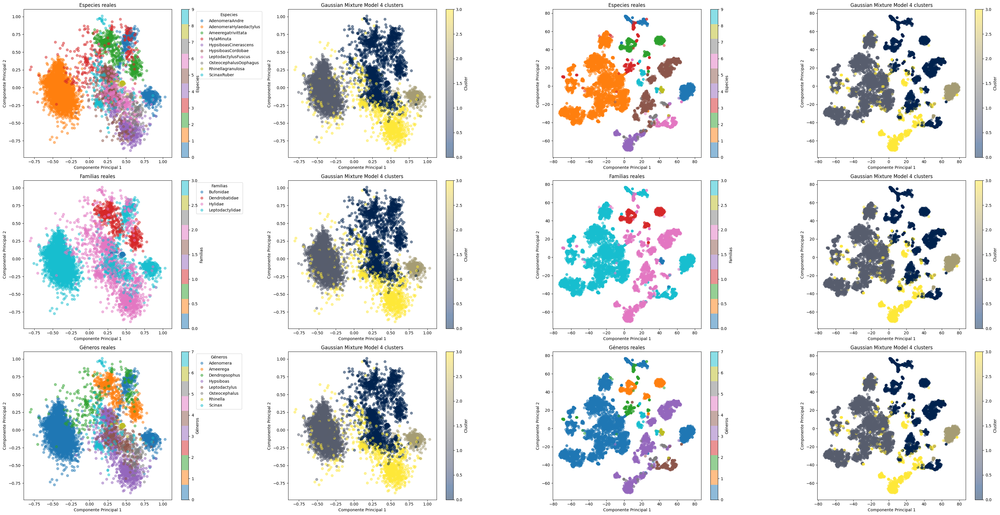

In [ ]:
# Reducción de dimensionalidad con PCA
pca = PCA(n_components=2)
df_frogs_pca = pca.fit_transform(df_frogs_cleaned_numeric)

# Crear la figura y los ejes
fig, axs = plt.subplots(3, 4, figsize=(35, 18))


# Graficar las etiquetas reales de las especies
scatter_species = create_scatter(axs[0, 0], encoded_labels_species, 'Especies reales', 'Especies', 'tab10')
handles_species, _ = scatter_species.legend_elements(prop="colors")
legend_labels_species = [label_to_species[i] for i in range(len(label_encoder_species.classes_))]
axs[0, 0].legend(handles_species, legend_labels_species, title="Especies", bbox_to_anchor=(1.15, 1), loc='upper left')

# Graficar las etiquetas reales de las familias
scatter_family = create_scatter(axs[1, 0], encoded_labels_family, 'Familias reales', 'Familias', 'tab10' )
handles_family, _ = scatter_family.legend_elements(prop="colors")
legend_labels_family = [label_to_family[i] for i in range(len(label_encoder_family.classes_))]
axs[1, 0].legend(handles_family, legend_labels_family, title="Familias", bbox_to_anchor=(1.15, 1), loc='upper left')

# Graficar las etiquetas reales de los géneros
scatter_genus = create_scatter(axs[2, 0], encoded_labels_genus, 'Géneros reales', 'Géneros', 'tab10')
handles_genus, _ = scatter_genus.legend_elements(prop="colors")
legend_labels_genus = [label_to_genus[i] for i in range(len(label_encoder_genus.classes_))]
axs[2, 0].legend(handles_genus, legend_labels_genus, title="Géneros", bbox_to_anchor=(1.15, 1), loc='upper left')


# Modelado con Gaussian Mixture Model (GMM)
gmm = GaussianMixture(n_components=4, random_state=42)
gmm_labels = gmm.fit_predict(df_frogs_cleaned_numeric)


# Graficar los clusters de Agglomerative Clustering
scatter_gmm = create_scatter(axs[0, 1], gmm_labels, 'Gaussian Mixture Model 4 clusters', 'Cluster', 'cividis')
scatter_gmm = create_scatter(axs[1, 1], gmm_labels, 'Gaussian Mixture Model 4 clusters', 'Cluster', 'cividis')
scatter_gmm = create_scatter(axs[2, 1], gmm_labels, 'Gaussian Mixture Model 4 clusters', 'Cluster', 'cividis')

#*****************************************************************************************************************************

# Graficar las etiquetas reales de las especies
scatter_species = create_scatter_tsne(axs[0, 2], encoded_labels_species, 'Especies reales', 'Especies', 'tab10')
handles_species, _ = scatter_species.legend_elements(prop="colors")
legend_labels_species = [label_to_species[i] for i in range(len(label_encoder_species.classes_))]
axs[0, 0].legend(handles_species, legend_labels_species, title="Especies", bbox_to_anchor=(1.15, 1), loc='upper left')

# Graficar las etiquetas reales de las familias
scatter_family = create_scatter_tsne(axs[1, 2], encoded_labels_family, 'Familias reales', 'Familias', 'tab10' )
handles_family, _ = scatter_family.legend_elements(prop="colors")
legend_labels_family = [label_to_family[i] for i in range(len(label_encoder_family.classes_))]
axs[1, 0].legend(handles_family, legend_labels_family, title="Familias", bbox_to_anchor=(1.15, 1), loc='upper left')

# Graficar las etiquetas reales de los géneros
scatter_genus = create_scatter_tsne(axs[2, 2], encoded_labels_genus, 'Géneros reales', 'Géneros', 'tab10')
handles_genus, _ = scatter_genus.legend_elements(prop="colors")
legend_labels_genus = [label_to_genus[i] for i in range(len(label_encoder_genus.classes_))]
axs[2, 0].legend(handles_genus, legend_labels_genus, title="Géneros", bbox_to_anchor=(1.15, 1), loc='upper left')


# Modelado con Gaussian Mixture Model (GMM)
gmm = GaussianMixture(n_components=4, random_state=42)
gmm_labels = gmm.fit_predict(df_frogs_cleaned_numeric)


# Graficar los clusters de Agglomerative Clustering
scatter_gmm = create_scatter_tsne(axs[0, 3], gmm_labels, 'Gaussian Mixture Model 4 clusters', 'Cluster', 'cividis')
scatter_gmm = create_scatter_tsne(axs[1, 3], gmm_labels, 'Gaussian Mixture Model 4 clusters', 'Cluster', 'cividis')
scatter_gmm = create_scatter_tsne(axs[2, 3], gmm_labels, 'Gaussian Mixture Model 4 clusters', 'Cluster', 'cividis')



plt.tight_layout()
plt.show()



<font color='Orange'>**Especies:**

Con GGM no podemos observar ninguna especie perfectamente agrupada , si podemos observar que se detectan grandes agrupaciones de especies como AdenomeraHylaedactylus(naranja) .

Puedo observar que una gran parte de AdenomeraAndre(azul) tmabien esta bien agrupada y distinguida , pero otra se sus partes se confunde con especies como Ameeregatrivittata(verde) ,HylaMinura(rojo) , HypsiboasCordobae(marron), Rhinellagranulosa(mostaza) ..etc.

Puedo observar tambien que las especies HypsiboasCinerascens(morada) y ScinaxRuber(azul claro) tambien se confunden

<font color='Orange'>**Familias:**

Podemos ver como Leptodactylidae , en su gran parte esta bien agrupada , pero tambien observamos partes de ellas que se confunden con el resto de familias.


<font color='Orange'>**Generos**

Gran parte del genero Adonomera se agrupa bien , pero ahy partes de este que se confunden con Ameerega(naranja), Dendropsophus(verde) , Hypsiboas(morado) , Rhinella(mostaza) ..etc.

En general todos los generos estan bastante confusos , excepto Adonomera que es algo más distinguible .




ARI

In [ ]:
# Modelado con KMeans
kmeans = KMeans(n_clusters=4, random_state=42, n_init=10)
kmeans.fit(df_frogs_cleaned_numeric)
kmeans_labels = kmeans.predict(df_frogs_cleaned_numeric)
# Calculo de ari para Kmeans con las etiquetas de Familia , genero y especies.
ari_Species_Kmeans = adjusted_rand_score(df_frogs_cleaned['Species'], kmeans_labels)
ari_Family_Kmeans = adjusted_rand_score(df_frogs_cleaned['Family'], kmeans_labels)
ari_Genero_Kmeans = adjusted_rand_score(df_frogs_cleaned['Genus'], kmeans_labels)

# Modelado con Agglomerative Clustering con 5 clusters
agglo = AgglomerativeClustering(n_clusters=5)
agglo_labels = agglo.fit_predict(df_frogs_cleaned_numeric)
# Calculo de ari para Aglomerative Clustering con las etiquetas de Familia , genero y especies.
ari_Species_Agglo = adjusted_rand_score(df_frogs_cleaned['Species'], agglo_labels)
ari_Family_Agglo = adjusted_rand_score(df_frogs_cleaned['Family'], agglo_labels)
ari_Genero_Agglo = adjusted_rand_score(df_frogs_cleaned['Genus'], agglo_labels)

# Modelado con Gaussian Mixture Model (GMM)
gmm = GaussianMixture(n_components=4, random_state=42)
gmm_labels = gmm.fit_predict(df_frogs_cleaned_numeric)
# Calculo de ari para Gaussian Mixture Model con las etiquetas de Familia , genero y especies.
ari_Species_gmm = adjusted_rand_score(df_frogs_cleaned['Species'], gmm_labels)
ari_Family_gmm = adjusted_rand_score(df_frogs_cleaned['Family'], gmm_labels)
ari_Genero_gmm = adjusted_rand_score(df_frogs_cleaned['Genus'], gmm_labels)



print("Kmeans")
print(f"ARI para KMeans-Species: {ari_Species_Kmeans}")
print(f"ARI para KMeans-Family: {ari_Family_Kmeans}")
print(f"ARI para KMeans-Genero: {ari_Genero_Kmeans}")
print()

print("Agglo")
print(f"ARI para Agglo-Species: {ari_Species_Agglo}")
print(f"ARI para Agglo-Family: {ari_Family_Agglo}")
print(f"ARI para Agglo-Genero: {ari_Genero_Agglo}")
print()

print("Gmm")
print(f"ARI para Gmm-Species: {ari_Species_gmm}")
print(f"ARI para Gmm-Family: {ari_Family_gmm}")
print(f"ARI para Gmm-Genero: {ari_Genero_gmm}")

Kmeans
ARI para KMeans-Species: 0.7861713745864651
ARI para KMeans-Family: 0.507670282344479
ARI para KMeans-Genero: 0.5803261326142201

Agglo
ARI para Agglo-Species: 0.8686517505516681
ARI para Agglo-Family: 0.5604202066294132
ARI para Agglo-Genero: 0.656182783535694

Gmm
ARI para Gmm-Species: 0.7297111220409759
ARI para Gmm-Family: 0.46599219007524867
ARI para Gmm-Genero: 0.5308120121950954


Debido a que observando los clusters , es bastante más complicado sacar conclusiones , como parte final he aplicado el ARI.

Podemos ver que para los tres modelos, son las especies las que mayor correspondencia tiene con los clusters originales , mientras que las familias y generos no tienen tanta.

Tambien observamos que es Gmm ,el que en general ,menor correspondencia tiene con los clusters originales.